In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import scipy.stats as stats
import pandas_profiling 

In [3]:
cust= pd.read_excel('C:/Users/vedso/OneDrive/Documents/Data Analytics/python/Python files/Case studies and assignments/Assignmets downloaed/Python advanced capestone projects/14, marketing analysis/CustomersData.xlsx')

In [4]:
disc= pd.read_csv('C:/Users/vedso/OneDrive/Documents/Data Analytics/python/Python files/Case studies and assignments/Assignmets downloaed/Python advanced capestone projects/14, marketing analysis/Discount_Coupon.csv')

In [5]:
marketing= pd.read_csv('C:/Users/vedso/OneDrive/Documents/Data Analytics/python/Python files/Case studies and assignments/Assignmets downloaed/Python advanced capestone projects/14, marketing analysis/Marketing_Spend.csv')

In [6]:
sales= pd.read_csv('C:/Users/vedso/OneDrive/Documents/Data Analytics/python/Python files/Case studies and assignments/Assignmets downloaed/Python advanced capestone projects/14, marketing analysis/Online_Sales.csv')

In [7]:
tax= pd.read_excel('C:/Users/vedso/OneDrive/Documents/Data Analytics/python/Python files/Case studies and assignments/Assignmets downloaed/Python advanced capestone projects/14, marketing analysis/Tax_amount.xlsx')

In [8]:
cust.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1468 entries, 0 to 1467
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   CustomerID     1468 non-null   int64 
 1   Gender         1468 non-null   object
 2   Location       1468 non-null   object
 3   Tenure_Months  1468 non-null   int64 
dtypes: int64(2), object(2)
memory usage: 46.0+ KB


In [9]:
cust.head(5)

,CustomerID,Gender,Location,Tenure_Months
0,17850,M,Chicago,12
1,13047,M,California,43
2,12583,M,Chicago,33
3,13748,F,California,30
4,15100,M,California,49


In [10]:
disc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204 entries, 0 to 203
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Month              204 non-null    object
 1   Product_Category   204 non-null    object
 2   Coupon_Code        204 non-null    object
 3   Discount_pct       204 non-null    int64 
dtypes: int64(1), object(3)
memory usage: 6.5+ KB


In [11]:
disc.head(5)

,Month,Product_Category,Coupon_Code,Discount_pct
0,Jan,Apparel,SALE10,10
1,Feb,Apparel,SALE20,20
2,Mar,Apparel,SALE30,30
3,Jan,Nest-USA,ELEC10,10
4,Feb,Nest-USA,ELEC20,20


In [12]:
marketing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           365 non-null    object 
 1   Offline_Spend  365 non-null    int64  
 2   Online_Spend   365 non-null    float64
dtypes: float64(1), int64(1), object(1)
memory usage: 8.7+ KB


In [13]:
marketing.head(5)

,Date,Offline_Spend,Online_Spend
0,1/1/2019,4500,2424.50
1,1/2/2019,4500,3480.36
2,1/3/2019,4500,1576.38
3,1/4/2019,4500,2928.55
4,1/5/2019,4500,4055.30


In [14]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52924 entries, 0 to 52923
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CustomerID           52924 non-null  int64  
 1   Transaction_ID       52924 non-null  int64  
 2   Transaction_Date     52924 non-null  int64  
 3   Product_SKU          52924 non-null  object 
 4   Product_Description  52924 non-null  object 
 5   Product_Category     52924 non-null  object 
 6   Quantity             52924 non-null  int64  
 7   Avg_Price            52924 non-null  float64
 8   Delivery_Charges     52924 non-null  float64
 9   Coupon_Status        52924 non-null  object 
dtypes: float64(2), int64(4), object(4)
memory usage: 4.0+ MB


In [15]:
sales.head(5)

,CustomerID,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status
0,17850,16679,20190101,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used
1,17850,16680,20190101,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used
2,17850,16681,20190101,GGOEGFKQ020399,Google Laptop and Cell Phone Stickers,Office,1,2.05,6.5,Used
3,17850,16682,20190101,GGOEGAAB010516,Google Men's 100% Cotton Short Sleeve Hero Tee...,Apparel,5,17.53,6.5,Not Used
4,17850,16682,20190101,GGOEGBJL013999,Google Canvas Tote Natural/Navy,Bags,1,16.50,6.5,Used


In [16]:
tax.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Product_Category  20 non-null     object 
 1   GST               20 non-null     float64
dtypes: float64(1), object(1)
memory usage: 448.0+ bytes


In [17]:
tax.head(5)

,Product_Category,GST
0,Nest-USA,0.10
1,Office,0.10
2,Apparel,0.18
3,Bags,0.18
4,Drinkware,0.18


# 1. Calculate the invoice amount or sales amount or revenue for each transcation and item level

In [18]:
sales.isna().sum()

CustomerID             0
Transaction_ID         0
Transaction_Date       0
Product_SKU            0
Product_Description    0
Product_Category       0
Quantity               0
Avg_Price              0
Delivery_Charges       0
Coupon_Status          0
dtype: int64

In [19]:
tax.isna().sum()

Product_Category    0
GST                 0
dtype: int64

In [20]:
merge1= pd.merge(sales , tax, "inner" , on='Product_Category' )

In [21]:
merge1.Transaction_Date = merge1.Transaction_Date.astype(str)

In [22]:
merge1.Transaction_Date= pd.to_datetime(merge1.Transaction_Date)

In [23]:
import calendar


In [24]:
merge1['Month']= merge1.Transaction_Date.dt.month

In [25]:
merge1['Month']= merge1['Month'].apply(lambda x: calendar.month_abbr[x])

In [26]:
merge1.columns

Index(['CustomerID', 'Transaction_ID', 'Transaction_Date', 'Product_SKU',
       'Product_Description', 'Product_Category', 'Quantity', 'Avg_Price',
       'Delivery_Charges', 'Coupon_Status', 'GST', 'Month'],
      dtype='object')

In [27]:
merge1.isna().sum()

CustomerID             0
Transaction_ID         0
Transaction_Date       0
Product_SKU            0
Product_Description    0
Product_Category       0
Quantity               0
Avg_Price              0
Delivery_Charges       0
Coupon_Status          0
GST                    0
Month                  0
dtype: int64

In [28]:
disc.isna().sum()

Month                0
Product_Category     0
Coupon_Code          0
Discount_pct         0
dtype: int64

In [29]:
merg2= pd.merge(merge1 , disc , how='inner' , left_on = ['Product_Category', 'Month'  ], right_on=['Product_Category ' , 'Month'])


In [30]:
merg2.isna().sum()

CustomerID             0
Transaction_ID         0
Transaction_Date       0
Product_SKU            0
Product_Description    0
Product_Category       0
Quantity               0
Avg_Price              0
Delivery_Charges       0
Coupon_Status          0
GST                    0
Month                  0
Product_Category       0
Coupon_Code            0
Discount_pct           0
dtype: int64

In [31]:
merg2.drop(columns='Product_Category ' , inplace=True )

In [32]:
merg2

,CustomerID,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status,GST,Month,Coupon_Code,Discount_pct
0,17850,16679,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.10,Jan,ELEC10,10
1,17850,16680,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.10,Jan,ELEC10,10
2,13047,16684,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,2,122.77,6.5,Clicked,0.10,Jan,ELEC10,10
3,13047,16684,2019-01-01,GGOENEBQ079199,Nest Protect Smoke + CO White Wired Alarm-USA,Nest-USA,1,81.50,6.5,Used,0.10,Jan,ELEC10,10
4,13047,16688,2019-01-01,GGOENEBB078899,Nest Cam Indoor Security Camera - USA,Nest-USA,1,122.77,6.5,Used,0.10,Jan,ELEC10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52519,12956,48475,2019-12-31,GGOENEBQ092299,Nest Secure Alarm System Starter Pack - USA,Nest,1,355.74,6.5,Clicked,0.05,Dec,NE30,30
52520,12956,48477,2019-12-31,GGOENEBQ086799,Nest Thermostat E - USA,Nest,1,100.91,6.5,Not Used,0.05,Dec,NE30,30
52521,14410,48490,2019-12-31,GGOENEBQ086799,Nest Thermostat E - USA,Nest,1,100.91,6.5,Clicked,0.05,Dec,NE30,30
52522,14410,48491,2019-12-31,GGOENEBQ086799,Nest Thermostat E - USA,Nest,1,100.91,6.5,Clicked,0.05,Dec,NE30,30


In [33]:
merg2.isna().sum()

CustomerID             0
Transaction_ID         0
Transaction_Date       0
Product_SKU            0
Product_Description    0
Product_Category       0
Quantity               0
Avg_Price              0
Delivery_Charges       0
Coupon_Status          0
GST                    0
Month                  0
Coupon_Code            0
Discount_pct           0
dtype: int64

## 1)  invoice amount = quantity X Avg Price * (1-discountpct) * (1+GST) +delivery charges 

In [34]:
invoice_amount= ((merg2.Quantity * merg2.Avg_Price)*(1-merg2.Discount_pct)*(1+merg2.GST))+(merg2.Delivery_Charges)


In [35]:
invoice_amount = np.abs(invoice_amount)

In [36]:
invoice_amount

0         1515.2290
1         1515.2290
2         2424.3460
3          800.3500
4         1208.9230
            ...    
52519    10825.7830
52520     3066.2095
52521     3066.2095
52522     3066.2095
52523     9211.6285
Length: 52524, dtype: float64

# 2) Perform Detailed Exploratory analysis 

In [37]:
# 2.1) Understanding how many customers acquired each month

In [38]:
merg2.groupby("Month").CustomerID.count()

Month
Apr    4098
Aug    6112
Dec    4502
Feb    3245
Jan    4023
Jul    5196
Jun    4159
Mar    4290
May    4516
Nov    3957
Oct    4153
Sep    4273
Name: CustomerID, dtype: int64

In [39]:
monthwise = merg2.groupby("Month").CustomerID.count()

In [40]:
monthwise= monthwise.reindex(["Jan" , "Feb" , "Mar" , "Apr" , "May" , "Jun" , "Jul", "Aug", "Sep" , "Oct", "Nov","Dec"])

In [41]:
monthwise

Month
Jan    4023
Feb    3245
Mar    4290
Apr    4098
May    4516
Jun    4159
Jul    5196
Aug    6112
Sep    4273
Oct    4153
Nov    3957
Dec    4502
Name: CustomerID, dtype: int64

# 2.2) understanding retention of customers month to month basis

In [42]:
merg2["invoice_amount"]= invoice_amount

In [43]:
merg2.head(5)

,CustomerID,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status,GST,Month,Coupon_Code,Discount_pct,invoice_amount
0,17850,16679,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229
1,17850,16680,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229
2,13047,16684,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,2,122.77,6.5,Clicked,0.1,Jan,ELEC10,10,2424.346
3,13047,16684,2019-01-01,GGOENEBQ079199,Nest Protect Smoke + CO White Wired Alarm-USA,Nest-USA,1,81.50,6.5,Used,0.1,Jan,ELEC10,10,800.350
4,13047,16688,2019-01-01,GGOENEBB078899,Nest Cam Indoor Security Camera - USA,Nest-USA,1,122.77,6.5,Used,0.1,Jan,ELEC10,10,1208.923


In [44]:
monthwise_new= pd.DataFrame(merg2.groupby([ "Month", "CustomerID"])["Transaction_ID" , "invoice_amount"].agg({"Transaction_ID": "count" ,"invoice_amount": sum }))

<ipython-input-44-ed5ab536ce7e>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  monthwise_new= pd.DataFrame(merg2.groupby([ "Month", "CustomerID"])["Transaction_ID" , "invoice_amount"].agg({"Transaction_ID": "count" ,"invoice_amount": sum }))


In [45]:
monthwise_new


Transaction_ID  invoice_amount
Month CustomerID                                
Apr   12429                   20      21902.7073
      12433                   74      49475.0667
      12471                   47      55998.0531
      12481                   10       8215.7920
      12494                    3       1299.0105
...                          ...             ...
Sep   18179                   17      41676.7988
      18190                    1        304.4150
      18212                   42      87887.8189
      18223                   32      90828.5812
      18233                    1       3168.0500

[2577 rows x 2 columns]

In [46]:
cust.sort_values(by='Tenure_Months', ascending=False)

,CustomerID,Gender,Location,Tenure_Months
1429,16030,F,New York,50
1454,16109,F,New York,50
598,16579,M,California,50
473,14032,M,New York,50
766,15392,M,California,50
...,...,...,...,...
1215,12970,F,California,2
1405,13728,F,New York,2
922,15034,M,New York,2
962,17389,F,New York,2


In [47]:
merg3= pd.merge( cust,merg2, "inner" , on="CustomerID")

In [48]:
merg3.head(5)

,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status,GST,Month,Coupon_Code,Discount_pct,invoice_amount
0,17850,M,Chicago,12,16679,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229
1,17850,M,Chicago,12,16680,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229
2,17850,M,Chicago,12,16696,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,2,122.77,6.5,Not Used,0.1,Jan,ELEC10,10,2424.346
3,17850,M,Chicago,12,16699,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,1,81.50,6.5,Clicked,0.1,Jan,ELEC10,10,800.350
4,17850,M,Chicago,12,16700,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Clicked,0.1,Jan,ELEC10,10,1515.229


In [49]:
merg4= merg3.groupby(['CustomerID', "Month"]).invoice_amount.sum()

In [50]:
merg4

CustomerID  Month
12346       Sep         884.9578
12347       Mar      377156.9160
            Nov       54071.3750
12348       Jun       25472.0154
            Oct        6779.5738
                        ...     
18269       Apr         874.7698
            Jun         496.6918
18277       Oct        2944.2000
18283       Jul       18881.5811
            Oct       42767.4116
Name: invoice_amount, Length: 2577, dtype: float64

In [51]:
merg4= merg4.reset_index(level="Month")

In [52]:
merg4

,Month,invoice_amount
CustomerID,,
12346,Sep,884.9578
12347,Mar,377156.9160
12347,Nov,54071.3750
12348,Jun,25472.0154
12348,Oct,6779.5738
...,...,...
18269,Apr,874.7698
18269,Jun,496.6918
18277,Oct,2944.2000


In [53]:
jan1= merg4[merg4.Month=="Jan"] #| 215 unique Customers transcated in Jan 2019

In [54]:
feb1= merg4[merg4.Month=="Feb" ] # 109 unique Customers transcated in Feb 2019

In [55]:
pd.merge(jan1, feb1 , "inner" , on="CustomerID").count() # 13 customers from Jan were retained in month of Feb . Rest were different customers 

Month_x             13
invoice_amount_x    13
Month_y             13
invoice_amount_y    13
dtype: int64

In [56]:
Mar1= merg4[merg4.Month=="Mar"]

In [57]:
pd.merge( feb1 ,Mar1, "inner" , on="CustomerID").count() # 11 customers from Feb also purchased in month of March . 

Month_x             11
invoice_amount_x    11
Month_y             11
invoice_amount_y    11
dtype: int64

In [58]:
Apr1= merg4[merg4.Month=="Apr"]

In [59]:
pd.merge( Mar1, Apr1, "inner" , on="CustomerID").count() # 24 customers from March also purchased in month of April

Month_x             24
invoice_amount_x    24
Month_y             24
invoice_amount_y    24
dtype: int64

In [60]:
May1= merg4[merg4.Month=="May"]

In [61]:
pd.merge(  Apr1, May1, "inner" , on="CustomerID").count() # 25 customers from April also purchased in month of May

Month_x             25
invoice_amount_x    25
Month_y             25
invoice_amount_y    25
dtype: int64

In [62]:
Jun1= merg4[merg4.Month=="Jun"]

In [63]:
pd.merge(  May1, Jun1, "inner" , on="CustomerID").count() # 37 customers from May also purchased in month ofJune

Month_x             37
invoice_amount_x    37
Month_y             37
invoice_amount_y    37
dtype: int64

In [64]:
Jul1= merg4[merg4.Month=="Jul"]

In [65]:
pd.merge(  Jun1,Jul1, "inner" , on="CustomerID").count() # 58 customers from June also purchased in month of July 

Month_x             58
invoice_amount_x    58
Month_y             58
invoice_amount_y    58
dtype: int64

In [66]:
Aug1= merg4[merg4.Month=="Aug"]

In [67]:
pd.merge(  Jul1, Aug1,"inner" , on="CustomerID").count() # 64 customers from Julyalso purchased in month of Aug

Month_x             64
invoice_amount_x    64
Month_y             64
invoice_amount_y    64
dtype: int64

In [68]:
Sep1= merg4[merg4.Month=="Sep"]

In [69]:
pd.merge(  Aug1, Sep1, "inner" , on="CustomerID").count() # 44 customers from August also purchased in month of Sep

Month_x             44
invoice_amount_x    44
Month_y             44
invoice_amount_y    44
dtype: int64

In [70]:
Oct1= merg4[merg4.Month=="Oct"]

In [71]:
pd.merge( Sep1, Oct1, "inner" , on="CustomerID").count() # 29 customers from Sep also purchased in month of Oct

Month_x             29
invoice_amount_x    29
Month_y             29
invoice_amount_y    29
dtype: int64

In [72]:
Nov1=  merg4[merg4.Month=="Nov"]

In [73]:
pd.merge(  Oct1, Nov1, "inner" , on="CustomerID").count() #31 customers from Oct also purchased in month of Nov

Month_x             31
invoice_amount_x    31
Month_y             31
invoice_amount_y    31
dtype: int64

In [74]:
Dec1=  merg4[merg4.Month=="Dec"]

In [75]:
pd.merge(  Nov1,Dec1, "inner" , on="CustomerID").count() # 28 customers from Nov also purchased in month of Dec

Month_x             28
invoice_amount_x    28
Month_y             28
invoice_amount_y    28
dtype: int64

### the above shows month to month customer retention in year 2019 starting from /jan till Dec 2019. 

## 2.3) how the revenues from existing / new customers month to month basis 

In [76]:
jan1.invoice_amount.sum() 

# total revenue in month of Jan by all clients i.e. at the begiining of year 2019 .

3960151.9903

### user defined function built to check total revenue month by month and distribution of revenue from exisitinga nd new clients

In [77]:

def retention_revenue(x, y): 
    
    
    p= round(pd.merge( x ,y, "inner" , on="CustomerID")['invoice_amount_y'].sum(),2) 
    
    q= round(y.invoice_amount.sum(),2)
    
    r= round(q-p,2)
    
    print ("Total_Revenue:" , q, 
           " ; " "Existing_client_Revenue:" ,p ," ; ",
           "New clients_revenue :", r)
    
    
    

In [78]:
retention_revenue(jan1, feb1) # from Jan to Feb revnue analysis 

Total_Revenue: 6504787.19  ; Existing_client_Revenue: 823488.59  ;  New clients_revenue : 5681298.6


In [79]:
retention_revenue(feb1, Mar1)# from Feb to March  revnue analysis 

Total_Revenue: 11192967.85  ; Existing_client_Revenue: 1049126.31  ;  New clients_revenue : 10143841.54


In [80]:
retention_revenue( Mar1 , Apr1) # from March to April month  revnue analysis 

Total_Revenue: 3969636.25  ; Existing_client_Revenue: 927209.05  ;  New clients_revenue : 3042427.2


In [81]:
retention_revenue( Apr1 , May1)# from April to May month revnue analysis 

Total_Revenue: 6440492.34  ; Existing_client_Revenue: 725281.25  ;  New clients_revenue : 5715211.09


In [82]:
retention_revenue( May1, Jun1)# from May to June month revnue analysis 

Total_Revenue: 10322962.6  ; Existing_client_Revenue: 1499679.43  ;  New clients_revenue : 8823283.17


In [83]:
retention_revenue(  Jun1, Jul1)# from June to July month  revnue analysis 

Total_Revenue: 3671161.52  ; Existing_client_Revenue: 846714.42  ;  New clients_revenue : 2824447.1


In [84]:
retention_revenue(  Jul1, Aug1)  # from July to aug revnue analysis 

Total_Revenue: 8373203.86  ; Existing_client_Revenue: 1875619.59  ;  New clients_revenue : 6497584.27


In [85]:
retention_revenue(  Aug1, Sep1)  # from Aug to Sep revnue analysis 

Total_Revenue: 11529665.07  ; Existing_client_Revenue: 1762065.53  ;  New clients_revenue : 9767599.54


In [86]:
retention_revenue(   Sep1, Oct1)  # from Sep to Oct revnue analysis 

Total_Revenue: 3994503.24  ; Existing_client_Revenue: 492926.93  ;  New clients_revenue : 3501576.31


In [87]:
retention_revenue(   Oct1, Nov1)# from Oct to Nov revnue analysis 

Total_Revenue: 10493575.92  ; Existing_client_Revenue: 821305.23  ;  New clients_revenue : 9672270.69


In [88]:
retention_revenue( Nov1, Dec1)# from Nov to Dec i.e last month 2019  revnue analysis 

Total_Revenue: 16601822.53  ; Existing_client_Revenue: 1446032.5  ;  New clients_revenue : 15155790.03


## 2.4 How the discount playing role in revenues ?

In [89]:
merg3.Discount_pct.unique()

array([10, 30, 20], dtype=int64)

In [90]:
merg3[merg3.Discount_pct==10].invoice_amount.sum()


15595453.0002

In [91]:
merg3[merg3.Discount_pct==20 ].invoice_amount.sum()

31812059.3116

In [92]:
merg3[merg3.Discount_pct==30 ].invoice_amount.sum()

49647418.0533

In [93]:
merg3[merg3.Discount_pct==10].invoice_amount.sum()/merg3.invoice_amount.sum()*100

16.06868702242454

In [94]:
merg3[merg3.Discount_pct==20 ].invoice_amount.sum()/merg3.invoice_amount.sum()*100

32.77737585502333

In [95]:
merg3[merg3.Discount_pct==30 ].invoice_amount.sum()/merg3.invoice_amount.sum()*100

51.153937122552115

###### As per above analysis , its clear that higher the discount , higher is the revenue
# 10 % discount = 16% of total invoice amount
# 20 % discount = 32 % of total invoice amount
# 30 % discount = 51% of total invoice amount

### 2.5 Analyse KPIs like Revenue,No of orders, avg order value, no of customers(existing and new), quantity by category by month by week and by day,

##### 1) Revenue by Catagory, by month, by week, by day

In [96]:
merg3.groupby("Month").invoice_amount.sum() # Revenue by month 

Month
Apr    3.969636e+06
Aug    8.373204e+06
Dec    1.660182e+07
Feb    6.504787e+06
Jan    3.960152e+06
Jul    3.671162e+06
Jun    1.032296e+07
Mar    1.119297e+07
May    6.440492e+06
Nov    1.049358e+07
Oct    3.994503e+06
Sep    1.152967e+07
Name: invoice_amount, dtype: float64

In [97]:
merg3.groupby("Product_Category").invoice_amount.sum() # Revenue by catagory

Product_Category
Accessories             1.433497e+05
Android                 1.512854e+04
Apparel                 1.302557e+07
Bags                    3.330331e+06
Bottles                 1.357688e+05
Drinkware               4.384683e+06
Gift Cards              2.730598e+05
Headgear                9.519390e+05
Housewares              8.055764e+04
Lifestyle               1.517651e+06
Nest                    1.146071e+07
Nest-Canada             1.454959e+06
Nest-USA                5.288545e+07
Notebooks & Journals    1.759878e+06
Office                  5.492769e+06
Waze                    1.431167e+05
Name: invoice_amount, dtype: float64

In [98]:
merg3["week"]= merg3.Transaction_Date.dt.strftime('%U') # converting dates into week of year 

In [99]:
merg3.groupby("week").invoice_amount.sum() # Revenue by week of year 

week
00    7.727018e+05
01    8.174860e+05
02    8.914698e+05
03    8.574709e+05
04    1.179510e+06
05    1.530185e+06
06    1.865730e+06
07    1.504084e+06
08    1.861617e+06
09    2.391775e+06
10    2.174973e+06
11    2.653615e+06
12    2.866151e+06
13    1.180370e+06
14    8.102930e+05
15    1.180772e+06
16    8.797923e+05
17    1.195650e+06
18    1.450396e+06
19    1.287544e+06
20    1.467736e+06
21    1.538538e+06
22    2.087976e+06
23    2.696607e+06
24    2.514238e+06
25    2.395290e+06
26    8.620452e+05
27    9.076952e+05
28    1.067336e+06
29    7.263632e+05
30    1.839745e+06
31    1.813300e+06
32    1.732617e+06
33    1.738568e+06
34    1.695724e+06
35    2.361717e+06
36    2.671706e+06
37    2.179447e+06
38    3.693025e+06
39    1.312168e+06
40    1.027423e+06
41    8.314875e+05
42    8.501064e+05
43    1.252529e+06
44    2.001199e+06
45    2.116581e+06
46    2.447624e+06
47    3.272733e+06
48    4.049037e+06
49    4.504533e+06
50    4.722070e+06
51    2.369927e+06
52    9

In [100]:
merg3.groupby(merg3.Transaction_Date.dt.day).invoice_amount.sum() # revenue by day of year

Transaction_Date
1     3.370302e+06
2     3.023552e+06
3     2.628523e+06
4     2.776764e+06
5     3.379341e+06
6     3.465347e+06
7     3.348135e+06
8     3.034594e+06
9     2.836874e+06
10    2.740119e+06
11    3.146588e+06
12    3.067344e+06
13    3.993945e+06
14    3.838994e+06
15    3.514966e+06
16    3.018486e+06
17    2.580878e+06
18    3.678666e+06
19    3.159579e+06
20    3.249700e+06
21    3.378887e+06
22    3.759481e+06
23    2.918077e+06
24    3.023554e+06
25    2.523570e+06
26    2.812937e+06
27    4.380315e+06
28    3.212524e+06
29    2.745742e+06
30    2.585624e+06
31    1.861523e+06
Name: invoice_amount, dtype: float64

###  quantity by category, month , week and day

In [101]:
merg3.groupby('Product_Category').Quantity.count() # Quantity  by product category wise 

Product_Category
Accessories               234
Android                    43
Apparel                 18126
Bags                     1882
Bottles                   268
Drinkware                3483
Gift Cards                159
Headgear                  771
Housewares                122
Lifestyle                3092
Nest                     2198
Nest-Canada               317
Nest-USA                14013
Notebooks & Journals      749
Office                   6513
Waze                      554
Name: Quantity, dtype: int64

In [102]:
merg3.groupby("Month").Quantity.count() # quantity  by month 

Month
Apr    4098
Aug    6112
Dec    4502
Feb    3245
Jan    4023
Jul    5196
Jun    4159
Mar    4290
May    4516
Nov    3957
Oct    4153
Sep    4273
Name: Quantity, dtype: int64

In [103]:
merg3.groupby("week").Quantity.count() # quantity   by week of the year

week
00     758
01     830
02     864
03     889
04     946
05     745
06     846
07     855
08     834
09    1030
10     852
11    1071
12     922
13     866
14    1043
15    1057
16     916
17    1134
18     994
19     963
20     997
21     889
22     884
23    1120
24    1002
25     886
26     724
27    1252
28    1399
29    1199
30    1503
31    1338
32    1388
33    1304
34    1339
35    1129
36     925
37     881
38    1079
39    1006
40    1013
41     847
42     866
43     969
44     781
45     856
46     890
47    1141
48    1182
49    1257
50    1299
51     547
52     217
Name: Quantity, dtype: int64

In [104]:
merg3.groupby(merg3.Transaction_Date.dt.day).Quantity.count() # quantity   by day of the year

Transaction_Date
1     1712
2     1588
3     1720
4     1724
5     1718
6     1865
7     1817
8     1522
9     1597
10    1602
11    1847
12    1732
13    2053
14    1818
15    1590
16    1728
17    1791
18    1971
19    1848
20    1659
21    1764
22    1717
23    1491
24    1666
25    1515
26    1647
27    2046
28    1653
29    1270
30    1612
31    1241
Name: Quantity, dtype: int64

### Average Order value  by category, month , week and day

In [105]:
merg3.groupby("Product_Category").Avg_Price.mean() #  avg order value by category

Product_Category
Accessories               8.211068
Android                  15.903488
Apparel                  19.788995
Bags                     29.830797
Bottles                   3.437201
Drinkware                10.696893
Gift Cards              111.363270
Headgear                 15.879624
Housewares                2.060574
Lifestyle                 3.860078
Nest                    194.221074
Nest-Canada             157.243249
Nest-USA                124.331850
Notebooks & Journals     11.758505
Office                    3.770012
Waze                      6.607852
Name: Avg_Price, dtype: float64

In [106]:
merg3.groupby("Month").Avg_Price.mean()  #  avg order value by month

Month
Apr    42.857943
Aug    34.764827
Dec    80.763678
Feb    53.506320
Jan    62.189908
Jul    38.276305
Jun    44.385691
Mar    45.328564
May    39.224457
Nov    86.002477
Oct    64.758375
Sep    50.063333
Name: Avg_Price, dtype: float64

In [107]:
merg3.groupby("week").Avg_Price.mean() #  avg order value by week

week
00    65.658417
01    58.469928
02    64.123750
03    64.675658
04    58.534799
05    55.246926
06    51.440957
07    50.069988
08    53.593837
09    44.020816
10    45.993568
11    42.938161
12    47.790879
13    37.324677
14    40.325647
15    46.788638
16    47.267893
17    38.952540
18    38.094577
19    34.108598
20    43.962598
21    42.458189
22    45.095407
23    38.071714
24    45.488513
25    50.735587
26    49.416782
27    39.973123
28    36.958077
29    34.883912
30    33.678064
31    33.406570
32    36.881037
33    33.560146
34    35.415691
35    36.189194
36    44.688919
37    45.621873
38    72.802502
39    59.510278
40    74.029289
41    62.727237
42    64.469342
43    63.664159
44    82.059296
45    73.243820
46    92.226382
47    94.527458
48    72.854281
49    76.566213
50    81.090747
51    99.502194
52    98.967788
Name: Avg_Price, dtype: float64

In [108]:
merg3.groupby(merg3.Transaction_Date.dt.day).Avg_Price.mean() # avg order by day 

Transaction_Date
1     52.296636
2     50.770793
3     49.774994
4     50.396966
5     52.125477
6     50.641694
7     48.895212
8     54.317543
9     51.189831
10    54.929307
11    53.354694
12    52.368493
13    48.475884
14    50.669153
15    51.629472
16    49.116840
17    50.367314
18    49.146139
19    50.286672
20    57.131181
21    51.971389
22    63.250338
23    57.869068
24    56.497539
25    55.922799
26    53.584372
27    56.899110
28    50.536068
29    57.875882
30    48.414107
31    46.798582
Name: Avg_Price, dtype: float64

###  no of orders / Transcations , by month , by week and by day 

In [109]:
merg3.groupby('Product_Category').Transaction_ID.count() # No Of orders by product category 

Product_Category
Accessories               234
Android                    43
Apparel                 18126
Bags                     1882
Bottles                   268
Drinkware                3483
Gift Cards                159
Headgear                  771
Housewares                122
Lifestyle                3092
Nest                     2198
Nest-Canada               317
Nest-USA                14013
Notebooks & Journals      749
Office                   6513
Waze                      554
Name: Transaction_ID, dtype: int64

In [110]:
merg3.groupby("Month").Transaction_ID.count() # No Of orders by Month 

Month
Apr    4098
Aug    6112
Dec    4502
Feb    3245
Jan    4023
Jul    5196
Jun    4159
Mar    4290
May    4516
Nov    3957
Oct    4153
Sep    4273
Name: Transaction_ID, dtype: int64

In [111]:
merg3.groupby("week").Transaction_ID.count() # No Of orders by week 

week
00     758
01     830
02     864
03     889
04     946
05     745
06     846
07     855
08     834
09    1030
10     852
11    1071
12     922
13     866
14    1043
15    1057
16     916
17    1134
18     994
19     963
20     997
21     889
22     884
23    1120
24    1002
25     886
26     724
27    1252
28    1399
29    1199
30    1503
31    1338
32    1388
33    1304
34    1339
35    1129
36     925
37     881
38    1079
39    1006
40    1013
41     847
42     866
43     969
44     781
45     856
46     890
47    1141
48    1182
49    1257
50    1299
51     547
52     217
Name: Transaction_ID, dtype: int64

In [112]:
merg3.groupby(merg3.Transaction_Date.dt.day).Transaction_ID.count() # No Of orders by day of year

Transaction_Date
1     1712
2     1588
3     1720
4     1724
5     1718
6     1865
7     1817
8     1522
9     1597
10    1602
11    1847
12    1732
13    2053
14    1818
15    1590
16    1728
17    1791
18    1971
19    1848
20    1659
21    1764
22    1717
23    1491
24    1666
25    1515
26    1647
27    2046
28    1653
29    1270
30    1612
31    1241
Name: Transaction_ID, dtype: int64

### Existing and New customers by product category, by month, by week and by day 

In [113]:
existing_cust= merg3[merg3.Tenure_Months >=12]

In [114]:
new_cust=merg3[merg3.Tenure_Months <12]

In [115]:
existing_cust.groupby('Product_Category').count()["CustomerID"]  # existing customers by product cat

Product_Category
Accessories               197
Android                    34
Apparel                 14549
Bags                     1536
Bottles                   208
Drinkware                2843
Gift Cards                115
Headgear                  617
Housewares                 95
Lifestyle                2482
Nest                     1793
Nest-Canada               261
Nest-USA                11248
Notebooks & Journals      582
Office                   5298
Waze                      434
Name: CustomerID, dtype: int64

In [116]:
existing_cust.groupby('Month').count()["CustomerID"]  # existing customers by Month 


Month
Apr    3474
Aug    4779
Dec    3755
Feb    2699
Jan    3267
Jul    3871
Jun    3103
Mar    3647
May    3642
Nov    3112
Oct    3310
Sep    3633
Name: CustomerID, dtype: int64

In [117]:
existing_cust.groupby('week').count()["CustomerID"]   # existing customers by week


week
00     746
01     752
02     680
03     636
04     667
05     569
06     727
07     753
08     706
09     916
10     666
11     952
12     727
13     723
14     898
15     968
16     732
17     971
18     730
19     702
20     838
21     784
22     649
23     794
24     782
25     626
26     551
27     924
28    1039
29    1020
30     969
31    1149
32    1142
33     909
34    1085
35     906
36     756
37     824
38     924
39     839
40     641
41     734
42     751
43     810
44     576
45     656
46     656
47     982
48    1009
49    1052
50    1045
51     495
52     154
Name: CustomerID, dtype: int64

In [118]:
existing_cust.groupby(merg3.Transaction_Date.dt.day).count()["CustomerID"]  # existing customers by day of year


Transaction_Date
1     1458
2     1152
3     1370
4     1507
5     1542
6     1453
7     1516
8     1174
9     1213
10    1083
11    1335
12    1266
13    1794
14    1550
15    1350
16    1264
17    1498
18    1644
19    1602
20    1402
21    1506
22    1338
23    1052
24    1521
25    1318
26    1284
27    1495
28    1319
29    1024
30    1353
31     909
Name: CustomerID, dtype: int64

In [119]:
new_cust.groupby('Product_Category').count()["CustomerID"] # New  customers by product category 

Product_Category
Accessories               37
Android                    9
Apparel                 3577
Bags                     346
Bottles                   60
Drinkware                640
Gift Cards                44
Headgear                 154
Housewares                27
Lifestyle                610
Nest                     405
Nest-Canada               56
Nest-USA                2765
Notebooks & Journals     167
Office                  1215
Waze                     120
Name: CustomerID, dtype: int64

In [120]:
new_cust.groupby('Month').count()["CustomerID"]# New  customers by month 

Month
Apr     624
Aug    1333
Dec     747
Feb     546
Jan     756
Jul    1325
Jun    1056
Mar     643
May     874
Nov     845
Oct     843
Sep     640
Name: CustomerID, dtype: int64

In [121]:
new_cust.groupby('week').count()["CustomerID"]# New  customers by week

week
00     12
01     78
02    184
03    253
04    279
05    176
06    119
07    102
08    128
09    114
10    186
11    119
12    195
13    143
14    145
15     89
16    184
17    163
18    264
19    261
20    159
21    105
22    235
23    326
24    220
25    260
26    173
27    328
28    360
29    179
30    534
31    189
32    246
33    395
34    254
35    223
36    169
37     57
38    155
39    167
40    372
41    113
42    115
43    159
44    205
45    200
46    234
47    159
48    173
49    205
50    254
51     52
52     63
Name: CustomerID, dtype: int64

In [122]:
new_cust.groupby(merg3.Transaction_Date.dt.day).count()["CustomerID"]# New  customers by day

Transaction_Date
1     254
2     436
3     350
4     217
5     176
6     412
7     301
8     348
9     384
10    519
11    512
12    466
13    259
14    268
15    240
16    464
17    293
18    327
19    246
20    257
21    258
22    379
23    439
24    145
25    197
26    363
27    551
28    334
29    246
30    259
31    332
Name: CustomerID, dtype: int64

## 2.6) understand trend and seasonlity of Sales by category, Location, Month etc 

##### 2.6.1) understand trend and seasonlity of Sales by category 

In [123]:
data1=merg3.loc[: , ["Transaction_Date" , "Product_Category","invoice_amount"]]

In [124]:
data2= data1.groupby(["Product_Category", 'Transaction_Date'])[ 'invoice_amount'].sum()

In [125]:
data2= pd.DataFrame(data2)

In [126]:
data2= data2.reset_index(level="Product_Category")

In [127]:
data2.drop(columns="Product_Category" , inplace=True)

In [128]:
data2# timeseries data grouped on product category 

,invoice_amount
Transaction_Date,
2019-01-29,504.0430
2019-03-04,1907.1810
2019-04-07,1075.8020
2019-04-19,162.2010
2019-04-28,389.9010
...,...
2019-12-22,300.7708
2019-12-25,719.9658
2019-12-26,76.9968


In [129]:
data5= data2[~data2.index.duplicated()] # remove duplicated Index)

<AxesSubplot:xlabel='Transaction_Date'>

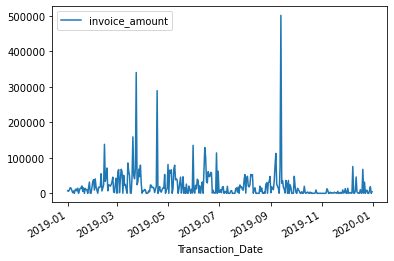

In [130]:
data5.plot()

In [131]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [132]:
decompose_productcate = seasonal_decompose(data5.asfreq("D"), model='multiplicative', two_sided=False, extrapolate_trend=4)

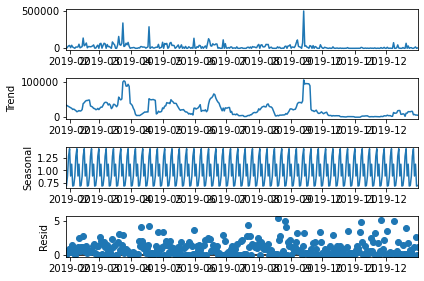

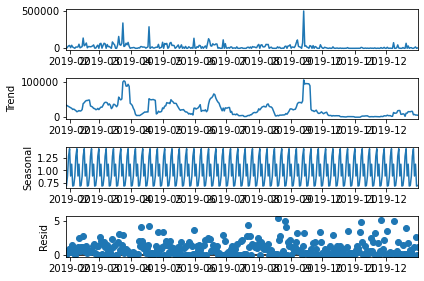

In [133]:
decompose_productcate.plot() # There is trend and seasonality both present in given data which is based on Product category 


In [134]:
decompose_data = pd.concat([decompose_productcate.trend, decompose_productcate.seasonal, decompose_productcate.resid, decompose_productcate.observed],axis=1)
decompose_data.columns = ['Trend', 'SI', "Irregular", "Actual"]

In [135]:
decompose_data

,Trend,SI,Irregular,Actual
Transaction_Date,,,,
2019-01-29,34402.764114,0.692913,0.021144,504.0430
2019-01-30,32648.784546,0.881751,0.588614,16945.0854
2019-01-31,30894.804977,1.287765,0.828830,32975.2208
2019-02-01,29140.825409,1.440160,0.918963,38566.5040
2019-02-02,27386.845840,0.886769,0.380728,9246.2768
...,...,...,...,...
2019-12-27,7188.542714,1.440160,0.011913,123.3330
2019-12-28,8221.629657,0.886769,1.105019,8056.3446
2019-12-29,6374.328143,1.127416,2.635793,18942.1730


##### 2.6.2) understand trend and Seasonlity by Location 

In [136]:
data_location=merg3.loc[: , ["Transaction_Date" , "Location","invoice_amount"]]

In [137]:
data_locationd2= data_location.groupby(["Location", 'Transaction_Date'])[ 'invoice_amount'].sum()


In [138]:
data_locationd2=pd.DataFrame(data_locationd2)

In [139]:
data_locationd2= data_locationd2.reset_index(level="Location")

In [140]:
data_locationd2.drop(columns="Location" , inplace=True)

In [141]:
data_locationd2= data_locationd2[~data_locationd2.index.duplicated()] # remove duplicated Index)

<AxesSubplot:xlabel='Transaction_Date'>

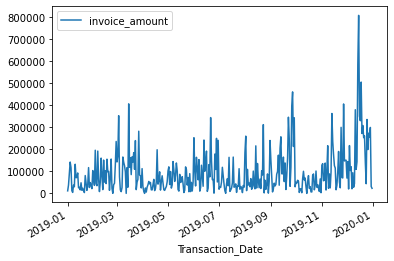

In [142]:
data_locationd2.plot()

In [143]:
decompose_location = seasonal_decompose(data_locationd2.asfreq("D"), model='multiplicative', two_sided=False, extrapolate_trend=4)

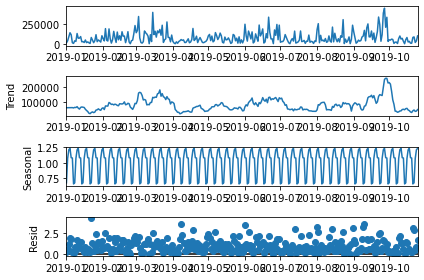

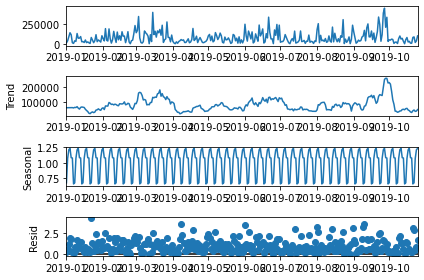

In [144]:
decompose_location.plot() # There is trend and seasonality both present in given data which is based on Location

In [145]:
decompose_location_data = pd.concat([decompose_location.trend, decompose_location.seasonal, decompose_location.resid, decompose_location.observed],axis=1)
decompose_location_data.columns = ['Trend', 'SI', "Irregular", "Actual"]

In [146]:
decompose_location_data

,Trend,SI,Irregular,Actual
Transaction_Date,,,,
2019-01-01,60666.925886,0.675429,0.282051,11557.3656
2019-01-02,60830.002217,1.068613,0.578249,37588.3542
2019-01-03,60993.078549,1.208734,1.232284,90849.4110
2019-01-04,61156.154880,1.232012,1.886564,142143.3269
2019-01-05,61319.231211,1.081472,1.752941,116246.3103
...,...,...,...,...
2019-10-21,40438.883771,0.657364,3.091443,82180.1034
2019-10-22,45372.166000,0.675429,2.874881,88102.6690
2019-10-23,36176.055800,1.068613,0.418535,16179.8194


###### 2.6.3) understand trend and Seasonlity by Month 

In [147]:
data_monthwise =merg3.loc[: , ["Transaction_Date" , "Month","invoice_amount"]]

In [148]:
data_monthwise= data_monthwise.groupby(["Month", 'Transaction_Date'])[ 'invoice_amount'].sum()

In [149]:
data_monthwise=data_monthwise.reset_index(level="Month")

In [150]:
data_monthwise.drop(columns="Month", inplace=True)

In [151]:
data_monthwise= data_monthwise[~data_monthwise.index.duplicated()] # remove duplicated Index)

<AxesSubplot:xlabel='Transaction_Date'>

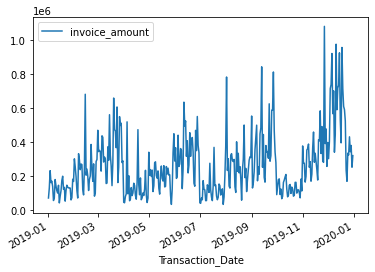

In [152]:
data_monthwise.plot()

In [153]:
decompose_monthwise = seasonal_decompose(data_monthwise.asfreq("D"), model='multiplicative', two_sided=False, extrapolate_trend=4)

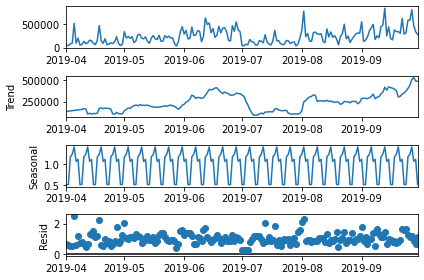

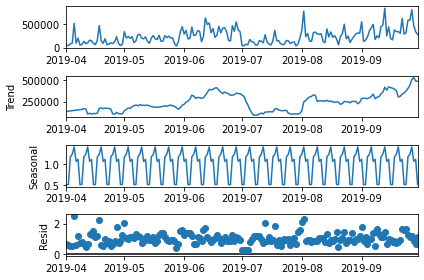

In [154]:
decompose_monthwise.plot()  # There is trend and seasonality both present in given data which is based on Month 

In [155]:
decompose_monthwise_data = pd.concat([decompose_monthwise.trend, decompose_monthwise.seasonal, decompose_monthwise.resid, decompose_monthwise.observed],axis=1)
decompose_monthwise_data.columns = ['Trend', 'SI', "Irregular", "Actual"]

In [156]:
decompose_monthwise_data

,Trend,SI,Irregular,Actual
Transaction_Date,,,,
2019-04-01,136660.923363,0.519553,0.680966,48350.3386
2019-04-02,139786.721976,0.521411,0.615916,44891.8777
2019-04-03,142912.520589,1.164112,0.490975,81681.6428
2019-04-04,146038.319201,1.227075,0.541730,97078.0092
2019-04-05,149164.117814,1.398292,2.491144,519590.2749
...,...,...,...,...
2019-09-26,437568.993429,1.227075,1.096491,588739.1147
2019-09-27,504242.909829,1.398292,1.151646,812001.1112
2019-09-28,527574.969714,1.061741,0.838314,469580.1695


### We have analysed trends and seasonality in all above data based on Product category, month and location 

# 2.7) How number order varies and sales with different days ?

In [157]:
merg3.groupby(merg3.Transaction_Date).Transaction_ID.count() # NO OF ORDERS ON DIFF DAYS IN YEAR

Transaction_Date
2019-01-01     88
2019-01-02    111
2019-01-03    206
2019-01-04    166
2019-01-05    187
             ... 
2019-12-27    103
2019-12-28     80
2019-12-29     89
2019-12-30     61
2019-12-31     67
Name: Transaction_ID, Length: 365, dtype: int64

Text(0, 0.5, 'NO OF ORDERS')

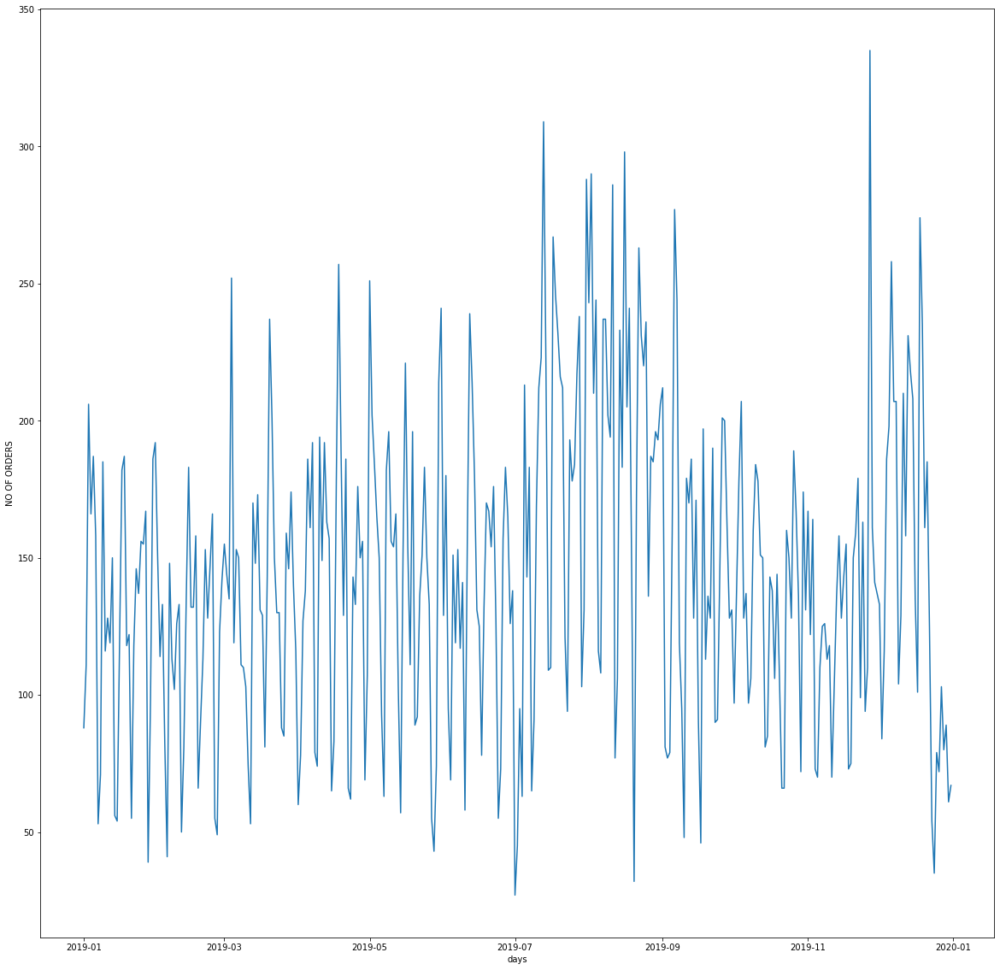

In [158]:
plt.figure(figsize=(20, 20))
plt.plot(merg3.groupby(merg3.Transaction_Date).Transaction_ID.count())
plt.xlabel('days')
plt.ylabel('NO OF ORDERS')

In [159]:
merg3.groupby(merg3.Transaction_Date).invoice_amount.sum() # SALES ON DIFF DAYS OF YEAR

Transaction_Date
2019-01-01     73064.6308
2019-01-02    131369.3302
2019-01-03    233335.2199
2019-01-04    163144.7965
2019-01-05    171787.8318
                 ...     
2019-12-27    431798.9829
2019-12-28    344503.9434
2019-12-29    381186.1813
2019-12-30    253588.8435
2019-12-31    321480.8095
Name: invoice_amount, Length: 365, dtype: float64

Text(0, 0.5, 'SALES AMOUNT ')

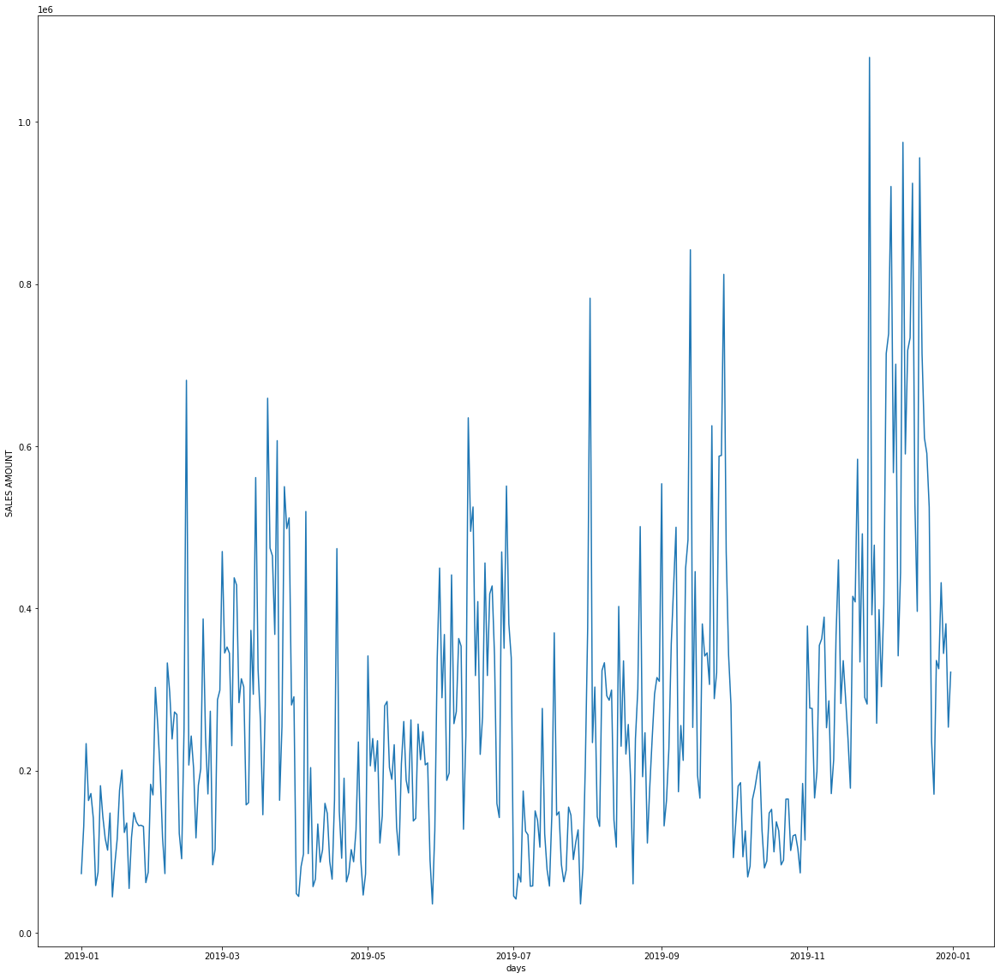

In [160]:
plt.figure(figsize=(20, 20))
plt.plot(merg3.groupby(merg3.Transaction_Date).invoice_amount.sum())
plt.xlabel('days')
plt.ylabel('SALES AMOUNT ')

## 2.8) Calculate revenue, marketing spend, % of marketing spend out of revenue , Tax, % of delivery charges by month 

In [161]:
marketing.Date =pd.to_datetime(marketing.Date)

In [162]:
# merging marketing merg2 and marketing 
marketing

,Date,Offline_Spend,Online_Spend
0,2019-01-01,4500,2424.50
1,2019-01-02,4500,3480.36
2,2019-01-03,4500,1576.38
3,2019-01-04,4500,2928.55
4,2019-01-05,4500,4055.30
...,...,...,...
360,2019-12-27,4000,3396.87
361,2019-12-28,4000,3246.84
362,2019-12-29,4000,2546.58
363,2019-12-30,4000,674.31


In [163]:
merge_marketing = pd.merge(merg2, marketing , "inner" , left_on="Transaction_Date" , right_on="Date")

In [164]:
merge_marketing.drop(columns= "Date" , inplace=True)

In [165]:
merge_marketing.head(5)

,CustomerID,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status,GST,Month,Coupon_Code,Discount_pct,invoice_amount,Offline_Spend,Online_Spend
0,17850,16679,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229,4500,2424.5
1,17850,16680,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229,4500,2424.5
2,13047,16684,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,2,122.77,6.5,Clicked,0.1,Jan,ELEC10,10,2424.346,4500,2424.5
3,13047,16684,2019-01-01,GGOENEBQ079199,Nest Protect Smoke + CO White Wired Alarm-USA,Nest-USA,1,81.50,6.5,Used,0.1,Jan,ELEC10,10,800.350,4500,2424.5
4,13047,16688,2019-01-01,GGOENEBB078899,Nest Cam Indoor Security Camera - USA,Nest-USA,1,122.77,6.5,Used,0.1,Jan,ELEC10,10,1208.923,4500,2424.5


##### Marketing spend by month

In [166]:
total_marketing= merge_marketing.Offline_Spend+merge_marketing.Online_Spend

In [167]:
merge_marketing["total_marketing"]=total_marketing

In [168]:
merge_marketing.groupby("Month").total_marketing.sum() 

Month
Apr    2.138256e+07
Aug    2.821659e+07
Dec    2.896440e+07
Feb    1.566517e+07
Jan    1.985330e+07
Jul    2.040864e+07
Jun    1.847309e+07
Mar    1.724297e+07
May    1.730855e+07
Nov    2.107643e+07
Oct    2.048250e+07
Sep    1.918812e+07
Name: total_marketing, dtype: float64

##### % of marketing spend out of revenue by month

In [169]:
(merge_marketing.total_marketing/merge_marketing.invoice_amount)*100 # monthwise % of marketing spend out of invoice/revenue amount

0        456.993629
1        456.993629
2        285.623422
3        865.183982
4        572.782551
            ...    
52519     55.965929
52520    197.597392
52521    197.597392
52522    197.597392
52523     65.772844
Length: 52524, dtype: float64

###### tax by month

In [170]:
tax= abs((merge_marketing.Quantity*merge_marketing.Avg_Price)*(1-merge_marketing.Discount_pct)*(merge_marketing.GST))

In [171]:
merge_marketing["tax"] = tax

In [172]:
merge_marketing.groupby("Month").tax.sum() # tax amount monthwise 

Month
Apr    4.388485e+05
Aug    8.442495e+05
Dec    1.465217e+06
Feb    6.939148e+05
Jan    4.073594e+05
Jul    3.919785e+05
Jun    1.106648e+06
Mar    1.227072e+06
May    7.060057e+05
Nov    8.627933e+05
Oct    3.584042e+05
Sep    1.136307e+06
Name: tax, dtype: float64

In [173]:
## % of delivery charges by month

In [174]:
delivery_monthwise = merge_marketing.groupby("Month").Delivery_Charges.sum()

In [175]:
invoice_monthwise = merge_marketing.groupby("Month").invoice_amount.sum()

In [176]:
(delivery_monthwise/invoice_monthwise)*100  ## delivery charges % of revenue amount every month

Month
Apr    1.031071
Aug    0.723678
Dec    0.228180
Feb    0.744902
Jan    1.474735
Jul    1.308145
Jun    0.358965
Mar    0.530014
May    0.632653
Nov    0.307692
Oct    1.147247
Sep    0.353541
dtype: float64

#### 2.9) how  marketing spend is impacting on revenue ?

In [177]:
new_data = merge_marketing.groupby("Month")["invoice_amount" , "total_marketing"].sum()

<ipython-input-177-6ba499173d2b>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  new_data = merge_marketing.groupby("Month")["invoice_amount" , "total_marketing"].sum()


In [178]:
new_data.invoice_amount = round(new_data.invoice_amount, 2)

In [179]:
new_data.total_marketing = round(new_data.total_marketing, 2)

In [180]:
new_data[new_data.total_marketing <  new_data.total_marketing.mean()]

,invoice_amount,total_marketing
Month,,
Feb,6504787.19,15665166.09
Jan,3960151.99,19853302.29
Jul,3671161.52,20408635.75
Jun,10322962.60,18473086.45
Mar,11192967.85,17242967.48
May,6440492.34,17308548.54
Oct,3994503.24,20482502.06
Sep,11529665.07,19188121.53


In [181]:
new_data[new_data.total_marketing <  new_data.total_marketing.mean()].invoice_amount.sum()

57616691.8

In [182]:
new_data[new_data.total_marketing <  new_data.total_marketing.mean()].invoice_amount.sum()/new_data.invoice_amount.sum()

0.5936503337469399

In [183]:
new_data[new_data.total_marketing >= new_data.total_marketing.mean()]

,invoice_amount,total_marketing
Month,,
Apr,3969636.25,21382564.17
Aug,8373203.86,28216592.47
Dec,16601822.53,28964402.01
Nov,10493575.92,21076434.26


In [184]:
new_data[new_data.total_marketing >= new_data.total_marketing.mean()].invoice_amount.sum()

39438238.56

In [185]:
new_data[new_data.total_marketing >= new_data.total_marketing.mean()].invoice_amount.sum()/new_data.invoice_amount.sum()

0.4063496662530603

In [186]:
new_data.sort_values(by="invoice_amount", ascending=False)

,invoice_amount,total_marketing
Month,,
Dec,16601822.53,28964402.01
Sep,11529665.07,19188121.53
Mar,11192967.85,17242967.48
Nov,10493575.92,21076434.26
Jun,10322962.60,18473086.45
Aug,8373203.86,28216592.47
Feb,6504787.19,15665166.09
May,6440492.34,17308548.54
Oct,3994503.24,20482502.06


In [187]:
# Dec has highest marketing spend which has resulted in highest invoice or revenue amount 
# however thats not case for all months . 
# 59% of total revenue is achieved when marketing spend is less than avrage marketing spend
# 40% of total revenue is achieved when marketing spens is morethan average makrting spend

## 2.10) which product appeared highest in transcations ?

In [188]:
sales.Product_Category.mode()   # apparel is highest appearing product cat in all transcations 
          

0    Apparel
dtype: object

## 2.11)which product was purchased mostly based on quantity?

In [189]:
quantitywise= sales.groupby("Product_Category").Quantity.count()

In [190]:
pd.DataFrame(quantitywise).sort_values(by="Quantity", ascending=False) # appearl was mostly purchased wigh higest quantity


,Quantity
Product_Category,
Apparel,18126
Nest-USA,14013
Office,6513
Drinkware,3483
Lifestyle,3092
Nest,2198
Bags,1882
Headgear,771
Notebooks & Journals,749


In [191]:
####

## ##  3. Performing customer segmentation 
 

### Heuristic Segmentation - (Value based RFM)- divide customers into Premium, gold, silver, standard customers and define startegy for the same 

In [192]:
merg3.head(5)

,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status,GST,Month,Coupon_Code,Discount_pct,invoice_amount,week
0,17850,M,Chicago,12,16679,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229,00
1,17850,M,Chicago,12,16680,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229,00
2,17850,M,Chicago,12,16696,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,2,122.77,6.5,Not Used,0.1,Jan,ELEC10,10,2424.346,00
3,17850,M,Chicago,12,16699,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,1,81.50,6.5,Clicked,0.1,Jan,ELEC10,10,800.350,00
4,17850,M,Chicago,12,16700,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Clicked,0.1,Jan,ELEC10,10,1515.229,00


In [193]:
data2= merg3.loc[:, ["CustomerID" , "Transaction_ID", "Transaction_Date" , "invoice_amount"]]

In [194]:
series= data2.Transaction_Date.apply(lambda x:pd.to_datetime("2019-12-31")-x)

In [195]:
series1= series.astype(str).str.replace("days" , "").astype(int)

In [196]:
data2["series1"] = series1

In [197]:
##  converting data into RFM 
new_data= data2.groupby("CustomerID")[["series1" , "Transaction_ID" , "invoice_amount"]].agg({"series1":min , "Transaction_ID": "count" , "invoice_amount": sum})

In [198]:
new_data.rename(columns={'series1': 'recency', 
                         'Transaction_ID': 'frequency', 
                         'invoice_amount': 'monetary'}, inplace=True)

In [199]:
new_data

,recency,frequency,monetary
CustomerID,,,
12346,107,2,884.9578
12347,59,59,431228.2910
12348,73,23,32251.5892
12350,17,17,43613.8118
12356,107,36,45595.1742
...,...,...,...
18259,270,6,4901.4060
18260,87,39,59340.9704
18269,194,8,1371.4616


In [200]:
new_data.isna().sum()  # no mssing in data 

recency      0
frequency    0
monetary     0
dtype: int64

In [201]:
# creating declies based on monetary / invoice amount generated by customers each

new_data['Deciles'] = pd.qcut(new_data.monetary, 10, labels=False)

In [202]:
new_data.Deciles.value_counts()

9    147
8    147
7    147
5    147
4    147
2    147
1    147
0    147
6    146
3    146
Name: Deciles, dtype: int64

In [203]:
new_data.groupby('Deciles').agg(np.mean)['monetary'] # finding avg invoice amount from each decile 

Deciles
0      1035.894647
1      5464.999295
2     11417.470224
3     18692.862438
4     29302.224278
5     42071.683405
6     58052.147621
7     80955.315178
8    124927.966384
9    288839.132960
Name: monetary, dtype: float64

In [204]:
#profiling
# Key performace variable selection
col_kpi=['monetary','recency','frequency']

In [205]:
profiling_output= new_data.groupby(['Deciles']).apply(lambda x: x[col_kpi].mean()).T

In [206]:
profiling_output

Deciles,0,1,2,3,4,5,6,7,8,9
monetary,1035.894647,5464.999295,11417.470224,18692.862438,29302.224278,42071.683405,58052.147621,80955.315178,124927.966384,288839.132960
recency,195.170068,186.238095,183.734694,167.431507,130.721088,138.292517,128.602740,121.489796,114.292517,77.000000
frequency,2.918367,8.829932,11.646259,15.945205,20.687075,28.795918,34.554795,44.925170,63.190476,126.156463


In [207]:
quantiles = new_data[['frequency','monetary','recency' ]].quantile(q=[0.33,0.67])
quantiles

,frequency,monetary,recency
0.33,13.0,17165.156632,78.00
0.67,35.0,61641.148699,187.89


In [208]:
# RFM segementation of customers 

new_data['r_seg'] = np.where(new_data.recency<=78, 'Active', np.where(new_data.recency<=187.89, 'At Risk', 'Churn'))

In [209]:
new_data['f_seg'] = np.where(new_data.frequency<=13, 1, np.where(new_data.frequency<=35, 2, 3))
new_data['m_seg'] = np.where(new_data.monetary<=17165.156632, 1, np.where(new_data.monetary<=61641.148699, 2, 3))

In [210]:
new_data

,recency,frequency,monetary,Deciles,r_seg,f_seg,m_seg
CustomerID,,,,,,,
12346,107,2,884.9578,0,At Risk,1,1
12347,59,59,431228.2910,9,Active,3,3
12348,73,23,32251.5892,4,Active,2,2
12350,17,17,43613.8118,5,Active,2,2
12356,107,36,45595.1742,5,At Risk,3,2
...,...,...,...,...,...,...,...
18259,270,6,4901.4060,1,Churn,1,1
18260,87,39,59340.9704,6,At Risk,3,2
18269,194,8,1371.4616,0,Churn,1,1


In [211]:
new_data['fm_seg'] = np.where(((new_data.f_seg == 3) & (new_data.m_seg ==3)) , 'Premium',
                          np.where((((new_data.f_seg == 3) & (new_data.m_seg ==2)) | ((new_data.f_seg == 2) & (new_data.m_seg ==3))) , 'Gold',
                          np.where((((new_data.f_seg == 1) & (new_data.m_seg ==3)) | ((new_data.f_seg == 3) & (new_data.m_seg ==1)) | ((new_data.f_seg == 2) & (new_data.m_seg ==2))), 'Silver', 'Standard' )))

In [212]:
new_data

,recency,frequency,monetary,Deciles,r_seg,f_seg,m_seg,fm_seg
CustomerID,,,,,,,,
12346,107,2,884.9578,0,At Risk,1,1,Standard
12347,59,59,431228.2910,9,Active,3,3,Premium
12348,73,23,32251.5892,4,Active,2,2,Silver
12350,17,17,43613.8118,5,Active,2,2,Silver
12356,107,36,45595.1742,5,At Risk,3,2,Gold
...,...,...,...,...,...,...,...,...
18259,270,6,4901.4060,1,Churn,1,1,Standard
18260,87,39,59340.9704,6,At Risk,3,2,Gold
18269,194,8,1371.4616,0,Churn,1,1,Standard


# Lets begin hueristic segmentaion of clients based on above derived paramters of RFM

In [213]:
new_data[(new_data.r_seg=='Active') & (new_data.fm_seg == 'Premium')] # premium and active cust

,recency,frequency,monetary,Deciles,r_seg,f_seg,m_seg,fm_seg
CustomerID,,,,,,,,
12347,59,59,431228.2910,9,Active,3,3,Premium
12377,40,76,165156.2696,9,Active,3,3,Premium
12431,40,44,93759.0200,7,Active,3,3,Premium
12471,15,127,266993.3371,9,Active,3,3,Premium
12472,62,125,187080.5990,9,Active,3,3,Premium
...,...,...,...,...,...,...,...,...
18055,26,96,256178.1595,9,Active,3,3,Premium
18077,73,63,107481.0544,8,Active,3,3,Premium
18125,48,82,222579.7825,9,Active,3,3,Premium


### segmenation 1) : premium and active customers 
#  we have 183 such premium customers who are active and giving maximum business. 
# strategy :::: we can cross sell and upsell them different products and maximise revenues



In [214]:
# Premium and at risk 
new_data[(new_data.r_seg=='At Risk') & (new_data.fm_seg == 'Premium')] # premium but at risk

,recency,frequency,monetary,Deciles,r_seg,f_seg,m_seg,fm_seg
CustomerID,,,,,,,,
12451,103,101,3.136189e+05,9,At Risk,3,3,Premium
12481,151,46,1.921620e+05,9,At Risk,3,3,Premium
12484,149,95,1.088331e+05,8,At Risk,3,3,Premium
12683,92,77,2.048286e+05,9,At Risk,3,3,Premium
12748,107,682,1.250758e+06,9,At Risk,3,3,Premium
...,...,...,...,...,...,...,...,...
18116,168,153,1.592177e+05,8,At Risk,3,3,Premium
18118,106,248,4.624226e+05,9,At Risk,3,3,Premium
18212,108,42,8.788782e+04,7,At Risk,3,3,Premium


#### segmenation 2) : premium but at risk customers whose recency has been not so good
# We have 120 such customers who did good businss in past but not much active now 
# strategy : we can contact them and send them attractive promotions to get them back on business . 

In [215]:
new_data[(new_data.r_seg=='Churn') & (new_data.fm_seg == 'Premium')] # premium but to be churned out 

,recency,frequency,monetary,Deciles,r_seg,f_seg,m_seg,fm_seg
CustomerID,,,,,,,,
12370,189,90,151388.2870,8,Churn,3,3,Premium
12433,265,145,134388.3016,8,Churn,3,3,Premium
12577,202,67,192598.1832,9,Churn,3,3,Premium
12647,188,52,97695.4288,7,Churn,3,3,Premium
12867,212,57,109110.0578,8,Churn,3,3,Premium
...,...,...,...,...,...,...,...,...
17967,333,47,96177.9486,7,Churn,3,3,Premium
17968,359,84,74093.5671,7,Churn,3,3,Premium
18004,235,40,64016.6850,6,Churn,3,3,Premium


##  Premium but churn customers 
# segmenation 3) : premium and churned customers whose recency is extremely poor.
# We have 75 such customers who did good businss in past but not much active now
# strategy : we can strategise plan to win them back and do more aggressive campeign . such as giving them more disocunts for doing business again 
# also start mofe frequent communication with them to keep in touch so that they dont churn out completely 


In [216]:
new_data[(new_data.r_seg=='Active') & ((new_data.fm_seg == 'Gold') | (new_data.fm_seg == 'Silver'))] # Gold /silver and active cust

,recency,frequency,monetary,Deciles,r_seg,f_seg,m_seg,fm_seg
CustomerID,,,,,,,,
12348,73,23,32251.5892,4,Active,2,2,Silver
12350,17,17,43613.8118,5,Active,2,2,Silver
12410,10,26,73374.5923,7,Active,2,3,Gold
12417,74,30,30095.5842,4,Active,2,2,Silver
12437,17,18,74276.4405,7,Active,2,3,Gold
...,...,...,...,...,...,...,...,...
18178,12,35,71006.5655,7,Active,2,3,Gold
18198,20,27,52513.9086,6,Active,2,2,Silver
18202,23,23,150740.1420,8,Active,2,3,Gold


#### We have 176  such Gold or silver customers who have been active too 
# strategy ::: We need to push them with more discount offers so that they purchase more and become premium cust


In [217]:
#################################################################################################################################

In [218]:
################################################################################################################################

# Second methos of segmentation - Scientific using K means . Understnd profiles and define strategy

In [219]:
%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 7.5
plt.rcParams['axes.grid'] = True

from matplotlib.backends.backend_pdf import PdfPages

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA  

In [220]:
final_merge= pd.merge( cust ,merge_marketing , "inner" , on="CustomerID")

In [221]:
final_merge.columns

Index(['CustomerID', 'Gender', 'Location', 'Tenure_Months', 'Transaction_ID',
       'Transaction_Date', 'Product_SKU', 'Product_Description',
       'Product_Category', 'Quantity', 'Avg_Price', 'Delivery_Charges',
       'Coupon_Status', 'GST', 'Month', 'Coupon_Code', 'Discount_pct',
       'invoice_amount', 'Offline_Spend', 'Online_Spend', 'total_marketing',
       'tax'],
      dtype='object')

In [222]:
final_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52524 entries, 0 to 52523
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   CustomerID           52524 non-null  int64         
 1   Gender               52524 non-null  object        
 2   Location             52524 non-null  object        
 3   Tenure_Months        52524 non-null  int64         
 4   Transaction_ID       52524 non-null  int64         
 5   Transaction_Date     52524 non-null  datetime64[ns]
 6   Product_SKU          52524 non-null  object        
 7   Product_Description  52524 non-null  object        
 8   Product_Category     52524 non-null  object        
 9   Quantity             52524 non-null  int64         
 10  Avg_Price            52524 non-null  float64       
 11  Delivery_Charges     52524 non-null  float64       
 12  Coupon_Status        52524 non-null  object        
 13  GST                  52524 non-

In [223]:
final_merge.apply(lambda x:x.nunique())

CustomerID              1468
Gender                     2
Location                   5
Tenure_Months             49
Transaction_ID         25000
Transaction_Date         365
Product_SKU             1135
Product_Description      395
Product_Category          16
Quantity                 151
Avg_Price                542
Delivery_Charges         267
Coupon_Status              3
GST                        4
Month                     12
Coupon_Code               45
Discount_pct               3
invoice_amount         10832
Offline_Spend             11
Online_Spend             365
total_marketing          365
tax                     5193
dtype: int64

In [224]:
pandas_profiling.ProfileReport(final_merge)

In [225]:
# lest drop unnecessary variables 
# Product SKU and Product description have high cordinality:  (1135 and 395) resepctively 


In [226]:
final_merge.drop(columns=["Product_SKU" , "Product_Description"] , inplace=True)

In [227]:
final_merge


,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status,GST,Month,Coupon_Code,Discount_pct,invoice_amount,Offline_Spend,Online_Spend,total_marketing,tax
0,17850,M,Chicago,12,16679,2019-01-01,Nest-USA,1,153.71,6.50,Used,0.10,Jan,ELEC10,10,1515.2290,4500,2424.50,6924.50,138.3390
1,17850,M,Chicago,12,16680,2019-01-01,Nest-USA,1,153.71,6.50,Used,0.10,Jan,ELEC10,10,1515.2290,4500,2424.50,6924.50,138.3390
2,17850,M,Chicago,12,16696,2019-01-01,Nest-USA,2,122.77,6.50,Not Used,0.10,Jan,ELEC10,10,2424.3460,4500,2424.50,6924.50,220.9860
3,17850,M,Chicago,12,16699,2019-01-01,Nest-USA,1,81.50,6.50,Clicked,0.10,Jan,ELEC10,10,800.3500,4500,2424.50,6924.50,73.3500
4,17850,M,Chicago,12,16700,2019-01-01,Nest-USA,1,153.71,6.50,Clicked,0.10,Jan,ELEC10,10,1515.2290,4500,2424.50,6924.50,138.3390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52519,14410,F,New York,45,48490,2019-12-31,Nest,1,100.91,6.50,Clicked,0.05,Dec,NE30,30,3066.2095,4000,2058.75,6058.75,146.3195
52520,14410,F,New York,45,48491,2019-12-31,Nest,1,100.91,6.50,Clicked,0.05,Dec,NE30,30,3066.2095,4000,2058.75,6058.75,146.3195
52521,14410,F,New York,45,48492,2019-12-31,Nest,3,100.91,6.50,Clicked,0.05,Dec,NE30,30,9211.6285,4000,2058.75,6058.75,438.9585
52522,14600,F,California,7,48496,2019-12-31,Nest-USA,5,80.52,6.50,Clicked,0.10,Dec,ELEC30,30,12836.4400,4000,2058.75,6058.75,1167.5400


In [228]:
final_merge.isna().sum()

CustomerID          0
Gender              0
Location            0
Tenure_Months       0
Transaction_ID      0
Transaction_Date    0
Product_Category    0
Quantity            0
Avg_Price           0
Delivery_Charges    0
Coupon_Status       0
GST                 0
Month               0
Coupon_Code         0
Discount_pct        0
invoice_amount      0
Offline_Spend       0
Online_Spend        0
total_marketing     0
tax                 0
dtype: int64

In [229]:
final_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52524 entries, 0 to 52523
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   CustomerID        52524 non-null  int64         
 1   Gender            52524 non-null  object        
 2   Location          52524 non-null  object        
 3   Tenure_Months     52524 non-null  int64         
 4   Transaction_ID    52524 non-null  int64         
 5   Transaction_Date  52524 non-null  datetime64[ns]
 6   Product_Category  52524 non-null  object        
 7   Quantity          52524 non-null  int64         
 8   Avg_Price         52524 non-null  float64       
 9   Delivery_Charges  52524 non-null  float64       
 10  Coupon_Status     52524 non-null  object        
 11  GST               52524 non-null  float64       
 12  Month             52524 non-null  object        
 13  Coupon_Code       52524 non-null  object        
 14  Discount_pct      5252

In [230]:
final_merge.drop(columns=["Transaction_Date" , "Coupon_Code"] , inplace=True) # also removing transcation date as we have month which is derived from date.variable from transcation date and then removing copon code which is 45, high cordinality )

In [231]:
# lets convert categorical into dummy variables , so that all variables are turned into numeric 

final_merge= pd.get_dummies(final_merge, columns=["Gender", "Location" , "Product_Category" , "Coupon_Status" , "Month" ], drop_first=True) #one hot encoding

In [232]:
final_merge.info()  # All Variables converted into numeric columns 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52524 entries, 0 to 52523
Data columns (total 46 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   CustomerID                             52524 non-null  int64  
 1   Tenure_Months                          52524 non-null  int64  
 2   Transaction_ID                         52524 non-null  int64  
 3   Quantity                               52524 non-null  int64  
 4   Avg_Price                              52524 non-null  float64
 5   Delivery_Charges                       52524 non-null  float64
 6   GST                                    52524 non-null  float64
 7   Discount_pct                           52524 non-null  int64  
 8   invoice_amount                         52524 non-null  float64
 9   Offline_Spend                          52524 non-null  int64  
 10  Online_Spend                           52524 non-null  float64
 11  to

In [233]:
# Now lets apply outlier and misisng on data 


#Handling Outliers 
def outlier_capping(x):
    #x = x.clip_upper(x.quantile(0.99))
    #x = x.clip_lower(x.quantile(0.01))
    x = x.clip(lower=x.quantile(0.01), upper=x.quantile(0.99))
    return x

final_merge=final_merge.apply(lambda x: outlier_capping(x))

In [234]:
#Handling missings on data treated with outliers already 
def Missing_imputation(x):
    x = x.fillna(x.mean())
    return x

final_merge=final_merge.apply(lambda x: Missing_imputation(x))

# K Means application 

#### # step 1) standardise data 
# step 2) feature reduction using PCA/ VIf/ corrlation matrix etc 

# step 3) Apply K means on train data 
# step 4) check model Accuracy using metrics ( SC score, f value or intertia, distribution of data within segment etc )
# step 5) Apply K means model to predict segmentation on test data 

In [235]:
# data standardisation 
sc= StandardScaler()

In [236]:
sc1 = sc.fit(final_merge)

In [237]:
standardised_finalmerge = sc1.transform(final_merge)

In [238]:
standardised_finalmerge = pd.DataFrame(standardised_finalmerge, columns = final_merge.columns)

In [239]:
standardised_finalmerge

,CustomerID,Tenure_Months,Transaction_ID,Quantity,Avg_Price,Delivery_Charges,GST,Discount_pct,invoice_amount,Offline_Spend,...,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep
0,1.419023,-1.049507,-1.779514,-0.308796,1.664114,-0.295476,-0.816167,-1.224673,-0.097651,1.782348,...,-0.306184,-0.256612,3.472165,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587
1,1.419023,-1.049507,-1.779514,-0.308796,1.664114,-0.295476,-0.816167,-1.224673,-0.097651,1.782348,...,-0.306184,-0.256612,3.472165,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587
2,1.419023,-1.049507,-1.779514,-0.191537,1.159163,-0.295476,-0.816167,-1.224673,0.270115,1.782348,...,-0.306184,-0.256612,3.472165,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587
3,1.419023,-1.049507,-1.779514,-0.308796,0.485622,-0.295476,-0.816167,-1.224673,-0.386842,1.782348,...,-0.306184,-0.256612,3.472165,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587
4,1.419023,-1.049507,-1.779514,-0.308796,1.664114,-0.295476,-0.816167,-1.224673,-0.097651,1.782348,...,-0.306184,-0.256612,3.472165,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52519,-0.529761,1.399769,1.805757,-0.308796,0.802400,-0.295476,-1.906328,1.236199,0.529769,1.247934,...,3.266009,-0.256612,-0.288005,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587
52520,-0.529761,1.399769,1.805757,-0.308796,0.802400,-0.295476,-1.906328,1.236199,0.529769,1.247934,...,3.266009,-0.256612,-0.288005,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587
52521,-0.529761,1.399769,1.805757,-0.074279,0.802400,-0.295476,-1.906328,1.236199,3.015782,1.247934,...,3.266009,-0.256612,-0.288005,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587
52522,-0.422125,-1.420609,1.805757,0.160238,0.469628,-0.295476,-0.816167,1.236199,4.384259,1.247934,...,3.266009,-0.256612,-0.288005,-0.331341,-0.293244,-0.29823,-0.306705,-0.285438,-0.293014,-0.297587


#### step 2 : Reduceing the features/ variables for segmentation - #PCA (Princicpal Component analysis)


In [240]:
pca_model = PCA(n_components=46)

In [241]:
pca_model = pca_model.fit(standardised_finalmerge)

In [242]:
pca_model.explained_variance_   # eigen values 

array([4.07357210e+00, 2.74516915e+00, 2.25000348e+00, 1.96350872e+00,
       1.76732815e+00, 1.46183044e+00, 1.41167173e+00, 1.30527944e+00,
       1.24163085e+00, 1.20391662e+00, 1.19205204e+00, 1.15053310e+00,
       1.12497953e+00, 1.11014995e+00, 1.10523985e+00, 1.08607040e+00,
       1.06957149e+00, 1.05196834e+00, 1.04581745e+00, 1.03727313e+00,
       1.02725274e+00, 1.00919817e+00, 9.92962197e-01, 9.67930877e-01,
       9.34386698e-01, 9.18065782e-01, 8.87254743e-01, 7.88635471e-01,
       7.29157636e-01, 6.95915726e-01, 5.64971456e-01, 3.93178704e-01,
       3.44796046e-01, 1.61032268e-01, 1.13538476e-01, 4.46075105e-02,
       2.34693067e-02, 3.66129942e-03, 2.47647799e-03, 7.23070088e-04,
       8.03370444e-31, 7.39020902e-32, 4.97933624e-32, 2.09297976e-32,
       2.09297976e-32, 1.04315997e-32])

In [243]:
pca_model.explained_variance_ratio_  # eigen value ratio

array([9.93535255e-02, 6.69540704e-02, 5.48770888e-02, 4.78895447e-02,
       4.31047440e-02, 3.56537220e-02, 3.44303622e-02, 3.18354777e-02,
       3.02831028e-02, 2.93632610e-02, 2.90738865e-02, 2.80612486e-02,
       2.74380026e-02, 2.70763126e-02, 2.69565564e-02, 2.64890176e-02,
       2.60866128e-02, 2.56572759e-02, 2.55072570e-02, 2.52988630e-02,
       2.50544680e-02, 2.46141210e-02, 2.42181291e-02, 2.36076207e-02,
       2.27894856e-02, 2.23914220e-02, 2.16399476e-02, 1.92346453e-02,
       1.77839940e-02, 1.69732311e-02, 1.37795293e-02, 9.58954192e-03,
       8.40949956e-03, 3.92754151e-03, 2.76917839e-03, 1.08796735e-03,
       5.72411216e-04, 8.92982858e-05, 6.04007523e-05, 1.76355200e-05,
       1.95940280e-32, 1.80245569e-33, 1.21444913e-33, 5.10473150e-34,
       5.10473150e-34, 2.54424417e-34])

In [244]:
np.cumsum(pca_model.explained_variance_ratio_)  # cumultaive sm of varaince ratio  ( assuming  cut off as 80% total to chose no of variables )

array([0.09935353, 0.1663076 , 0.22118468, 0.26907423, 0.31217897,
       0.3478327 , 0.38226306, 0.41409854, 0.44438164, 0.4737449 ,
       0.50281879, 0.53088003, 0.55831804, 0.58539435, 0.61235091,
       0.63883992, 0.66492654, 0.69058381, 0.71609107, 0.74138993,
       0.7664444 , 0.79105852, 0.81527665, 0.83888427, 0.86167376,
       0.88406518, 0.90570513, 0.92493977, 0.94272377, 0.959697  ,
       0.97347653, 0.98306607, 0.99147557, 0.99540311, 0.99817229,
       0.99926025, 0.99983267, 0.99992196, 0.99998236, 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        ])

In [245]:
# first 22 variables cumulatively total up to 79 % of variance in total 
# so lets chose first 22  variables 

pca_model = PCA(n_components=22)
pca_model.fit(standardised_finalmerge)

PCA(n_components=22)

In [246]:
pca_model.explained_variance_

array([4.0735721 , 2.74516913, 2.25000334, 1.9635087 , 1.76732685,
       1.46183042, 1.41167128, 1.3052786 , 1.24162996, 1.20391551,
       1.19202798, 1.15046749, 1.1249562 , 1.11014484, 1.10523781,
       1.08607032, 1.06957088, 1.05196829, 1.04580934, 1.03726152,
       1.0272525 , 1.00916505])

In [247]:
pca_model.explained_variance_ratio_

array([0.09935353, 0.06695407, 0.05487709, 0.04788954, 0.04310471,
       0.03565372, 0.03443035, 0.03183546, 0.03028308, 0.02936323,
       0.0290733 , 0.02805965, 0.02743743, 0.02707619, 0.02695651,
       0.02648902, 0.0260866 , 0.02565727, 0.02550706, 0.02529858,
       0.02505446, 0.02461331])

In [248]:
sum(pca_model.explained_variance_ratio_)

0.7910541611022786

In [249]:
# 79% of total variance in data is achieved by above 22 variables. 

In [250]:
# convert the above arrays into dataframe and name the columns as PCS finalised 

pcs= pd.DataFrame((pca_model.transform(standardised_finalmerge)), columns=["pc1","pc2","pc3","pc4","pc5","pc6","pc7", "pc8", "pc9", "pc10", "pc11" , "pc12" , "pc13" , "pc14", "pc15" , "pc16","pc17","pc18","pc19","pc20","pc21" , "pc22"])

In [251]:
pcs

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc13,pc14,pc15,pc16,pc17,pc18,pc19,pc20,pc21,pc22
0,1.543367,0.305953,-3.359583,2.113880,-2.736999,-0.335161,-1.148767,-1.593117,0.914598,0.003659,...,-1.329561,-0.381364,-0.660464,-0.407617,0.989124,1.172915,-0.451303,-0.968572,-0.327695,-0.173557
1,1.543367,0.305953,-3.359583,2.113880,-2.736999,-0.335161,-1.148767,-1.593117,0.914598,0.003659,...,-1.329561,-0.381364,-0.660464,-0.407617,0.989124,1.172915,-0.451303,-0.968572,-0.327695,-0.173557
2,1.641444,0.362072,-3.087751,2.319672,-2.722089,-0.067045,-1.301675,1.831757,1.084726,0.235311,...,-1.501050,-0.356551,-0.686682,-0.518286,0.862483,1.174372,-0.426085,-0.982545,-0.400833,-0.177465
3,0.878286,-0.004425,-3.280139,2.280394,-2.534253,-0.488465,-1.280663,-0.105047,0.998760,0.113288,...,-1.452809,-0.336004,-0.640227,-0.455131,1.002074,1.127537,-0.438634,-0.931323,-0.371327,-0.149694
4,1.551610,0.305003,-3.359243,2.117944,-2.763012,-0.304616,-1.247644,-0.113667,1.011427,0.088430,...,-1.384008,-0.360695,-0.661378,-0.428645,0.944768,1.202095,-0.437205,-0.964443,-0.357221,-0.173909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52519,3.899734,-2.468378,0.021768,-1.188005,1.565741,-1.731306,1.131020,0.395545,0.293928,-0.627403,...,1.680106,1.581063,-0.570560,0.953905,-0.015946,0.764096,0.385475,0.092201,1.321843,-0.479627
52520,3.899734,-2.468378,0.021768,-1.188005,1.565741,-1.731306,1.131020,0.395545,0.293928,-0.627403,...,1.680106,1.581063,-0.570560,0.953905,-0.015946,0.764096,0.385475,0.092201,1.321843,-0.479627
52521,5.344028,-1.749681,0.776283,-0.826816,1.455746,-0.782032,1.474008,0.397237,0.025777,-0.517960,...,1.694993,1.471917,-0.703457,0.946031,-0.131500,0.751773,0.404209,0.111838,1.392370,-0.533662
52522,6.167739,-0.225788,2.156145,0.373057,-0.530226,1.570960,0.826416,0.284601,-1.634600,0.069574,...,-0.420766,0.608927,-1.029292,0.068560,0.647342,-0.545714,0.809394,-0.022500,-0.248701,0.981157


#### calculate factor loadings - to get original variables instead of pc variables # this can be done using factor loading model 


In [252]:
loading = pd.DataFrame((pca_model.components_.T*np.sqrt(pca_model.explained_variance_)).T , columns=standardised_finalmerge.columns).T

In [253]:
loading.columns =[pcs.columns]

In [254]:
loading

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9,pc10,...,pc13,pc14,pc15,pc16,pc17,pc18,pc19,pc20,pc21,pc22
CustomerID,-0.016779,7.134044e-02,-2.247038e-02,1.081506e-01,-1.304071e-01,-1.406020e-01,9.219500e-02,-1.379358e-02,1.506833e-01,-2.224380e-01,...,-1.571984e-01,4.812940e-02,-9.387313e-02,7.267265e-02,-1.173242e-02,-2.845799e-02,8.827156e-03,-7.829276e-02,2.474230e-01,6.632286e-02
Tenure_Months,0.030416,-6.060477e-02,3.249431e-02,2.557197e-02,-8.309682e-03,-1.057989e-02,-1.220435e-01,-1.459549e-02,1.439661e-01,8.374285e-02,...,1.675455e-01,7.009012e-02,-1.580047e-01,-1.663544e-01,3.224635e-02,-2.186332e-01,3.114272e-02,2.767761e-01,1.038084e-01,-3.324313e-01
Transaction_ID,0.380287,-5.294714e-01,1.568688e-01,-5.032615e-01,4.418466e-01,1.602945e-01,4.661212e-02,-6.244571e-04,-2.245455e-04,2.121075e-02,...,-7.014394e-02,-6.330227e-03,-4.293321e-02,-4.947290e-02,4.244457e-02,-8.387017e-02,7.107635e-04,2.836804e-02,-6.870831e-04,5.373460e-02
Quantity,0.038586,1.246485e-01,1.922710e-01,5.410209e-01,4.295541e-01,3.656895e-01,1.548112e-01,1.125111e-02,-6.857939e-02,1.782447e-02,...,-5.237822e-02,-7.232270e-02,-6.462283e-02,-4.883442e-02,-4.068280e-02,-2.855344e-02,1.119626e-02,-6.972085e-03,4.981766e-03,-2.788992e-02
Avg_Price,0.785817,2.841529e-01,-2.492919e-01,-2.480864e-01,-2.206403e-01,4.382043e-02,-1.685806e-02,-8.280949e-03,5.137889e-02,-3.794528e-02,...,6.101448e-02,-8.686121e-03,-1.670973e-03,2.685994e-02,-3.735749e-02,6.925586e-02,3.236439e-04,-3.486431e-02,6.013541e-03,-1.514433e-02
Delivery_Charges,-0.091800,7.537278e-02,1.254110e-01,4.564380e-01,2.476376e-01,2.500919e-01,7.577544e-02,-5.229607e-03,-3.179626e-03,6.367677e-02,...,1.281535e-01,2.174856e-02,-3.166777e-02,6.912663e-02,-5.964180e-02,1.500134e-01,2.973624e-02,-1.029931e-01,6.078722e-02,3.745391e-02
GST,-0.667836,-2.994390e-01,3.702139e-01,-5.383096e-02,-3.629687e-01,3.804964e-01,1.001184e-01,-1.025736e-02,6.030558e-02,-9.098293e-02,...,-3.455236e-02,-1.112766e-02,4.091656e-02,-3.184352e-02,9.768658e-03,-1.498359e-02,1.710071e-02,6.013481e-03,-1.064267e-02,5.513221e-03
Discount_pct,0.318132,-7.257651e-02,8.383401e-01,7.652687e-03,-2.085400e-02,-3.571387e-01,-4.054612e-02,-6.087426e-03,6.478854e-02,1.173249e-02,...,-1.352954e-02,2.800962e-02,3.781117e-02,8.975934e-03,8.122590e-03,-3.383025e-03,1.663958e-02,-7.603107e-03,1.584206e-03,1.470887e-02
invoice_amount,0.808140,3.048662e-01,2.517983e-01,7.411903e-02,-4.090558e-02,2.479972e-01,8.877877e-02,-2.529902e-04,-6.219275e-02,3.155881e-02,...,1.965261e-02,-2.279967e-02,-2.812916e-02,1.815382e-02,-3.492231e-02,1.455527e-02,9.859462e-03,-9.705817e-03,3.197090e-02,-1.568726e-02
Offline_Spend,0.365162,-6.504103e-01,-1.371222e-01,3.184690e-01,-1.729468e-01,-3.335287e-02,-4.355600e-02,-1.867874e-02,4.403145e-02,-2.965560e-04,...,2.088166e-02,2.910247e-02,-9.212137e-02,-1.184684e-02,-2.398221e-02,5.139732e-02,-4.016393e-02,-1.815807e-03,-4.524282e-02,4.412659e-02


In [255]:
loading.to_csv("loadings1.csv")

In [256]:
# based on studying loading.csv file in excel, we segragate Pcs sorted from large to small . and pick up largest 2 variables from each PCs

#PCA can be used for any type of business problem (regressin, classificaiton, segmentation)
selected_vars = [ 'CustomerID', 'Tenure_Months', 'Transaction_ID', 'total_marketing' ,'Discount_pct','Month_Jan','Quantity',
                'Delivery_Charges', 'GST' ,'Product_Category_Office','Location_New York','Coupon_Status_Not Used',
                 'Gender_M','Month_Sep', 'Location_Washington DC'  ,'Month_Aug', 'Location_New Jersey' ,'Product_Category_Apparel',
'Month_Mar' ,'Month_Jul', 'Month_Feb','Month_Nov' ,'Product_Category_Bags', 'Product_Category_Lifestyle' ,'Month_Jun' ,'Product_Category_Waze']



In [257]:
len(selected_vars) # 25 selected variables 

26

In [258]:
final_input_segmentation = standardised_finalmerge[selected_vars]   #variable reduction

In [259]:
final_input_segmentation

,CustomerID,Tenure_Months,Transaction_ID,total_marketing,Discount_pct,Month_Jan,Quantity,Delivery_Charges,GST,Product_Category_Office,...,Location_New Jersey,Product_Category_Apparel,Month_Mar,Month_Jul,Month_Feb,Month_Nov,Product_Category_Bags,Product_Category_Lifestyle,Month_Jun,Product_Category_Waze
0,1.419023,-1.049507,-1.779514,1.550673,-1.224673,3.472165,-0.308796,-0.295476,-0.816167,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247
1,1.419023,-1.049507,-1.779514,1.550673,-1.224673,3.472165,-0.308796,-0.295476,-0.816167,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247
2,1.419023,-1.049507,-1.779514,1.550673,-1.224673,3.472165,-0.191537,-0.295476,-0.816167,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247
3,1.419023,-1.049507,-1.779514,1.550673,-1.224673,3.472165,-0.308796,-0.295476,-0.816167,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247
4,1.419023,-1.049507,-1.779514,1.550673,-1.224673,3.472165,-0.308796,-0.295476,-0.816167,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52519,-0.529761,1.399769,1.805757,0.939318,1.236199,-0.288005,-0.308796,-0.295476,-1.906328,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247
52520,-0.529761,1.399769,1.805757,0.939318,1.236199,-0.288005,-0.308796,-0.295476,-1.906328,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247
52521,-0.529761,1.399769,1.805757,0.939318,1.236199,-0.288005,-0.074279,-0.295476,-1.906328,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247
52522,-0.422125,-1.420609,1.805757,0.939318,1.236199,-0.288005,0.160238,-0.295476,-0.816167,-0.376235,...,-0.304992,-0.725913,-0.29823,-0.331341,-0.256612,-0.285438,-0.192777,-0.250101,-0.293244,-0.103247


#### step 3 : applying K means model on data for clustering

In [260]:
km_3 = KMeans(n_clusters=3, random_state=123).fit(final_input_segmentation)
km_4 = KMeans(n_clusters=4, random_state=123).fit(final_input_segmentation)
km_5 = KMeans(n_clusters=5, random_state=123).fit(final_input_segmentation)
km_6 = KMeans(n_clusters=6, random_state=123).fit(final_input_segmentation)
km_7 = KMeans(n_clusters=7, random_state=123).fit(final_input_segmentation)
km_8 = KMeans(n_clusters=8, random_state=123).fit(final_input_segmentation)


In [261]:
final_merge['cluster_3'] = km_3.labels_
final_merge['cluster_4'] = km_4.labels_

final_merge['cluster_5'] = km_5.labels_
final_merge['cluster_6'] = km_6.labels_
final_merge['cluster_7'] = km_7.labels_
final_merge['cluster_8'] = km_8.labels_

In [262]:
final_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52524 entries, 0 to 52523
Data columns (total 52 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   CustomerID                             52524 non-null  int64  
 1   Tenure_Months                          52524 non-null  int64  
 2   Transaction_ID                         52524 non-null  float64
 3   Quantity                               52524 non-null  int64  
 4   Avg_Price                              52524 non-null  float64
 5   Delivery_Charges                       52524 non-null  float64
 6   GST                                    52524 non-null  float64
 7   Discount_pct                           52524 non-null  int64  
 8   invoice_amount                         52524 non-null  float64
 9   Offline_Spend                          52524 non-null  int64  
 10  Online_Spend                           52524 non-null  float64
 11  to

In [263]:
#Choosing best solution (optimal solution) - Identifying best value of K
#1. Metrics	
#    a. Silhoutte coeficient	between -1 & 1	
        #		Closer to 1, segmentation is good	
        #		Closer to-1, segmentation is bad	
#	b. Pseudo F-value	 ( intertia value i.e value of sum of error )

#2. Profiling of segments			
#3. Best practices			
#	Segment distribution	4%-40%	
#	Strategy can be implementable or not	

#### accuracy metrics 1) checking sc score (metrics 2 SC score : if close to 1 , good and closer to -1 bad) this is another metrcis to check which km model is good 

In [264]:
# calculate SC for K=3 through K=12
k_range = range(3, 9)
scores = []
for k in k_range:
    km = KMeans(n_clusters=k, random_state=123)
    km.fit(final_input_segmentation)
    scores.append(silhouette_score(final_input_segmentation, km.labels_))


In [265]:
scores  # Based on SC score cluster 8 has score closer to 1 comapred to others.

[0.08790887529323495,
 0.09150823193480132,
 0.10872381456514334,
 0.14592758447258153,
 0.13580903046785675,
 0.17521547623230596]

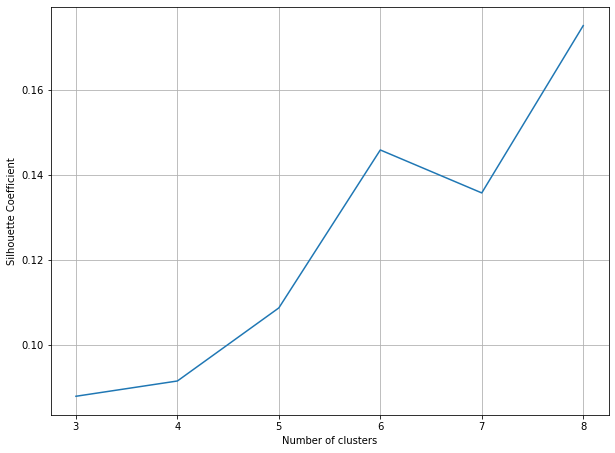

In [266]:
# plot the results
plt.plot(k_range, scores)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.grid(True)

In [267]:
#based on sc score, the solution K=7 and k=8 looks good

#### Accuracy Metrics 2) another metrics is to check segment  distribution





In [268]:
pd.Series(km_3.labels_).value_counts()/ sum(pd.Series(km_3.labels_).value_counts()) # how its internally distributed in percentage wise

1    0.516888
0    0.384186
2    0.098926
dtype: float64

In [269]:
pd.Series(km_4.labels_).value_counts()/ sum(pd.Series(km_4.labels_).value_counts()) # how its internally distributed in percentage wise 

2    0.476525
3    0.242327
1    0.164782
0    0.116366
dtype: float64

In [270]:
pd.Series(km_5.labels_).value_counts()/ sum(pd.Series(km_4.labels_).value_counts()) # how its internally distributed in percentage wise 

1    0.487549
0    0.274998
3    0.081677
2    0.079183
4    0.076594
dtype: float64

In [271]:
pd.Series(km_6.labels_).value_counts()/ sum(pd.Series(km_4.labels_).value_counts()) # how its internally distributed in percentage wise 

0    0.436029
1    0.242403
2    0.098926
5    0.081677
4    0.079183
3    0.061781
dtype: float64

In [272]:
pd.Series(km_7.labels_).value_counts()/ sum(pd.Series(km_4.labels_).value_counts()) # how its internally distributed in percentage wise 

1    0.420931
0    0.259672
3    0.080744
2    0.078516
4    0.075432
6    0.074157
5    0.010548
dtype: float64

In [273]:
pd.Series(km_8.labels_).value_counts()/ sum(pd.Series(km_4.labels_).value_counts()) # how its internally distributed in percentage wise 

2    0.319663
1    0.202079
3    0.098926
5    0.081677
7    0.081353
0    0.079183
6    0.075337
4    0.061781
dtype: float64

In [274]:
# based on distribution percentage above , cluster 3, cluster 4, cluster 5, cluster 6, cluster 7 have more than 40% in one sub group. 
#  Cluster 8 has distribution 4-40 percent as desired range 
# as per SC score, Inertia(f value) and also distribution , cluster 8 or cluster 7 look appropriate
# Profiling will be another method to cross check the same 

#### Accuracy Metrics 3 -- Profiling of clusters 

In [275]:

size=pd.concat([pd.Series(final_merge.cluster_3.size), pd.Series.sort_index(final_merge.cluster_3.value_counts()), pd.Series.sort_index(final_merge.cluster_4.value_counts()),
           pd.Series.sort_index(final_merge.cluster_5.value_counts()), pd.Series.sort_index(final_merge.cluster_6.value_counts()),
           pd.Series.sort_index(final_merge.cluster_7.value_counts()), pd.Series.sort_index(final_merge.cluster_8.value_counts())])

In [276]:
size

0    52524
0    20179
1    27149
2     5196
0     6112
1     8655
2    25029
3    12728
0    14444
1    25608
2     4159
3     4290
4     4023
0    22902
1    12732
2     5196
3     3245
4     4159
5     4290
0    13639
1    22109
2     4124
3     4241
4     3962
5      554
6     3895
0     4159
1    10614
2    16790
3     5196
4     3245
5     4290
6     3957
7     4273
dtype: int64

In [277]:
segsize= pd.DataFrame(size , columns=["segsize"])

In [278]:
segpct = pd.DataFrame(size/final_merge.cluster_3.size ,columns=["segpct"])

In [279]:
pd.concat([segsize.T , segpct.T] , axis=0)

,0,0,1,2,0,1,2,3,0,1,...,5,6,0,1,2,3,4,5,6,7
segsize,52524.0,20179.000000,27149.000000,5196.000000,6112.000000,8655.000000,25029.000000,12728.000000,14444.000000,25608.000000,...,554.000000,3895.000000,4159.000000,10614.000000,16790.000000,5196.000000,3245.000000,4290.000000,3957.000000,4273.000000
segpct,1.0,0.384186,0.516888,0.098926,0.116366,0.164782,0.476525,0.242327,0.274998,0.487549,...,0.010548,0.074157,0.079183,0.202079,0.319663,0.098926,0.061781,0.081677,0.075337,0.081353


In [280]:
final_merge.apply(np.mean).T

CustomerID                               15345.135919
Tenure_Months                               26.140393
Transaction_ID                           32444.808831
Quantity                                     3.633463
Avg_Price                                   51.744361
Delivery_Charges                             9.698632
GST                                          0.137433
Discount_pct                                19.953164
invoice_amount                            1756.622940
Offline_Spend                             2832.428985
Online_Spend                              1891.353869
total_marketing                           4728.563632
tax                                        172.170529
Gender_M                                     0.376152
Location_Chicago                             0.347270
Location_New Jersey                          0.085104
Location_New York                            0.211275
Location_Washington DC                       0.051576
Product_Category_Android    

In [281]:
# Mean value gives a good indication of the distribution of data. So we are finding mean value for each variable for each cluster
Profling_output = pd.concat([final_merge.apply(lambda x: x.mean()).T, final_merge.groupby('cluster_3').apply(lambda x: x.mean()).T, final_merge.groupby('cluster_4').apply(lambda x: x.mean()).T,
          final_merge.groupby('cluster_5').apply(lambda x: x.mean()).T, final_merge.groupby('cluster_6').apply(lambda x: x.mean()).T,
          final_merge.groupby('cluster_7').apply(lambda x: x.mean()).T, final_merge.groupby('cluster_8').apply(lambda x: x.mean()).T], axis=1)


In [282]:
Profling_output

,0,0,1,2,0,1,2,3,0,1,...,5,6,0,1,2,3,4,5,6,7
CustomerID,15345.135919,15588.615640,15213.295002,15088.433025,15032.273397,15276.906181,15428.355188,15378.122172,15285.447452,15277.361254,...,15344.850181,15233.670347,15324.959365,15156.897682,15521.604586,15088.433025,15464.709707,15481.380886,15236.127622,15324.455418
Tenure_Months,26.140393,25.917984,26.482486,25.216705,25.974967,26.409128,25.868912,26.570946,26.109388,26.097587,...,25.250903,25.216175,26.567685,26.725363,25.939011,25.216705,26.215716,26.810490,25.185747,26.340042
Transaction_ID,32444.808831,23355.723277,39091.873109,33012.073903,35730.723004,45268.147896,28134.789324,30622.524984,34360.983351,35501.151457,...,32944.972238,43736.544801,30497.600385,40430.312421,28258.375402,33012.073903,20480.810786,23109.998601,43736.369725,38265.500585
Quantity,3.633463,4.121166,3.325905,3.346420,3.282886,2.780474,3.817332,4.020270,1.775685,4.513550,...,1.857401,3.269320,3.640539,2.928868,3.891304,3.346420,4.044992,4.334732,3.252464,4.048912
Avg_Price,51.744361,47.942457,57.147802,38.276420,34.765416,81.468656,48.416599,46.229126,18.198655,71.294078,...,6.607852,83.901327,44.386749,53.056479,51.605881,38.276420,53.506937,45.329590,82.721974,48.982687
Delivery_Charges,9.698632,11.104914,8.761844,9.131953,9.326302,8.062761,10.088314,10.223523,8.723726,9.613311,...,9.019386,7.795879,8.905559,8.945200,9.925141,9.131953,12.261871,12.202578,7.790799,9.447374
GST,0.137433,0.139881,0.134203,0.144806,0.148549,0.118266,0.139341,0.141378,0.180000,0.112672,...,0.180000,0.115430,0.143229,0.137254,0.137494,0.144806,0.136105,0.141690,0.116442,0.139209
Discount_pct,19.953164,18.075722,23.253527,10.000000,20.000000,24.961294,13.100803,30.000000,18.583495,18.974539,...,20.379061,20.000000,30.000000,24.241568,12.689696,10.000000,20.000000,30.000000,20.000000,30.000000
invoice_amount,1756.622940,1511.005194,2145.580372,678.200151,1253.055486,3053.748106,1086.389911,2434.376589,579.851631,2332.398095,...,258.501851,2635.994422,2324.512399,2210.353021,1057.876738,678.200151,1929.748755,2456.827211,2600.461417,2517.903483
Offline_Spend,2832.428985,2731.304822,3028.362002,2201.404927,2739.037958,3530.213749,2722.861481,2618.243243,2814.151205,2906.150422,...,2798.916968,3068.164313,2668.550132,3246.749576,2861.566409,2201.404927,2888.536210,2415.384615,3069.876169,2771.823075


In [283]:
Profling_outputfinal= pd.concat([segpct.T, segsize.T , Profling_output], axis=0)

In [284]:
Profling_outputfinal

,0,0,1,2,0,1,2,3,0,1,...,5,6,0,1,2,3,4,5,6,7
segpct,1.000000,0.384186,0.516888,0.098926,0.116366,0.164782,0.476525,0.242327,0.274998,0.487549,...,0.010548,0.074157,0.079183,0.202079,0.319663,0.098926,0.061781,0.081677,0.075337,0.081353
segsize,52524.000000,20179.000000,27149.000000,5196.000000,6112.000000,8655.000000,25029.000000,12728.000000,14444.000000,25608.000000,...,554.000000,3895.000000,4159.000000,10614.000000,16790.000000,5196.000000,3245.000000,4290.000000,3957.000000,4273.000000
CustomerID,15345.135919,15588.615640,15213.295002,15088.433025,15032.273397,15276.906181,15428.355188,15378.122172,15285.447452,15277.361254,...,15344.850181,15233.670347,15324.959365,15156.897682,15521.604586,15088.433025,15464.709707,15481.380886,15236.127622,15324.455418
Tenure_Months,26.140393,25.917984,26.482486,25.216705,25.974967,26.409128,25.868912,26.570946,26.109388,26.097587,...,25.250903,25.216175,26.567685,26.725363,25.939011,25.216705,26.215716,26.810490,25.185747,26.340042
Transaction_ID,32444.808831,23355.723277,39091.873109,33012.073903,35730.723004,45268.147896,28134.789324,30622.524984,34360.983351,35501.151457,...,32944.972238,43736.544801,30497.600385,40430.312421,28258.375402,33012.073903,20480.810786,23109.998601,43736.369725,38265.500585
Quantity,3.633463,4.121166,3.325905,3.346420,3.282886,2.780474,3.817332,4.020270,1.775685,4.513550,...,1.857401,3.269320,3.640539,2.928868,3.891304,3.346420,4.044992,4.334732,3.252464,4.048912
Avg_Price,51.744361,47.942457,57.147802,38.276420,34.765416,81.468656,48.416599,46.229126,18.198655,71.294078,...,6.607852,83.901327,44.386749,53.056479,51.605881,38.276420,53.506937,45.329590,82.721974,48.982687
Delivery_Charges,9.698632,11.104914,8.761844,9.131953,9.326302,8.062761,10.088314,10.223523,8.723726,9.613311,...,9.019386,7.795879,8.905559,8.945200,9.925141,9.131953,12.261871,12.202578,7.790799,9.447374
GST,0.137433,0.139881,0.134203,0.144806,0.148549,0.118266,0.139341,0.141378,0.180000,0.112672,...,0.180000,0.115430,0.143229,0.137254,0.137494,0.144806,0.136105,0.141690,0.116442,0.139209
Discount_pct,19.953164,18.075722,23.253527,10.000000,20.000000,24.961294,13.100803,30.000000,18.583495,18.974539,...,20.379061,20.000000,30.000000,24.241568,12.689696,10.000000,20.000000,30.000000,20.000000,30.000000


In [285]:
Profling_outputfinal.columns = ['Overall', 'KM3_1', 'KM3_2', 'KM3_3',
                                'KM4_1', 'KM4_2', 'KM4_3', 'KM4_4',
                                'KM5_1', 'KM5_2', 'KM5_3', 'KM5_4', 'KM5_5',
                                'KM6_1', 'KM6_2', 'KM6_3', 'KM6_4', 'KM6_5','KM6_6',
                                'KM7_1', 'KM7_2', 'KM7_3', 'KM7_4', 'KM7_5','KM7_6','KM7_7',
                                'KM8_1', 'KM8_2', 'KM8_3', 'KM8_4', 'KM8_5','KM8_6','KM8_7','KM8_8']


In [286]:
Profling_outputfinal

,Overall,KM3_1,KM3_2,KM3_3,KM4_1,KM4_2,KM4_3,KM4_4,KM5_1,KM5_2,...,KM7_6,KM7_7,KM8_1,KM8_2,KM8_3,KM8_4,KM8_5,KM8_6,KM8_7,KM8_8
segpct,1.000000,0.384186,0.516888,0.098926,0.116366,0.164782,0.476525,0.242327,0.274998,0.487549,...,0.010548,0.074157,0.079183,0.202079,0.319663,0.098926,0.061781,0.081677,0.075337,0.081353
segsize,52524.000000,20179.000000,27149.000000,5196.000000,6112.000000,8655.000000,25029.000000,12728.000000,14444.000000,25608.000000,...,554.000000,3895.000000,4159.000000,10614.000000,16790.000000,5196.000000,3245.000000,4290.000000,3957.000000,4273.000000
CustomerID,15345.135919,15588.615640,15213.295002,15088.433025,15032.273397,15276.906181,15428.355188,15378.122172,15285.447452,15277.361254,...,15344.850181,15233.670347,15324.959365,15156.897682,15521.604586,15088.433025,15464.709707,15481.380886,15236.127622,15324.455418
Tenure_Months,26.140393,25.917984,26.482486,25.216705,25.974967,26.409128,25.868912,26.570946,26.109388,26.097587,...,25.250903,25.216175,26.567685,26.725363,25.939011,25.216705,26.215716,26.810490,25.185747,26.340042
Transaction_ID,32444.808831,23355.723277,39091.873109,33012.073903,35730.723004,45268.147896,28134.789324,30622.524984,34360.983351,35501.151457,...,32944.972238,43736.544801,30497.600385,40430.312421,28258.375402,33012.073903,20480.810786,23109.998601,43736.369725,38265.500585
Quantity,3.633463,4.121166,3.325905,3.346420,3.282886,2.780474,3.817332,4.020270,1.775685,4.513550,...,1.857401,3.269320,3.640539,2.928868,3.891304,3.346420,4.044992,4.334732,3.252464,4.048912
Avg_Price,51.744361,47.942457,57.147802,38.276420,34.765416,81.468656,48.416599,46.229126,18.198655,71.294078,...,6.607852,83.901327,44.386749,53.056479,51.605881,38.276420,53.506937,45.329590,82.721974,48.982687
Delivery_Charges,9.698632,11.104914,8.761844,9.131953,9.326302,8.062761,10.088314,10.223523,8.723726,9.613311,...,9.019386,7.795879,8.905559,8.945200,9.925141,9.131953,12.261871,12.202578,7.790799,9.447374
GST,0.137433,0.139881,0.134203,0.144806,0.148549,0.118266,0.139341,0.141378,0.180000,0.112672,...,0.180000,0.115430,0.143229,0.137254,0.137494,0.144806,0.136105,0.141690,0.116442,0.139209
Discount_pct,19.953164,18.075722,23.253527,10.000000,20.000000,24.961294,13.100803,30.000000,18.583495,18.974539,...,20.379061,20.000000,30.000000,24.241568,12.689696,10.000000,20.000000,30.000000,20.000000,30.000000


In [287]:
# analysing the above table in excel with conditional formatting 
Profling_outputfinal.to_excel("profiling_outputfinal.xlsx")

In [288]:
# Based on analysing of above profiling output, its suggested that KM7 Or KM 8 fits good for segmentation as they have better distinction than other clusters 

#### Accuracy Metrics 4) Check Cluster error 

In [289]:
# ELBOW ANALYSIS TO CHECK CLUSTER ERROR 
cluster_range = range( 3, 12 )
cluster_errors = []

for num_clusters in cluster_range:
    clusters = KMeans( num_clusters )
    clusters.fit( standardised_finalmerge )
    cluster_errors.append( clusters.inertia_ )

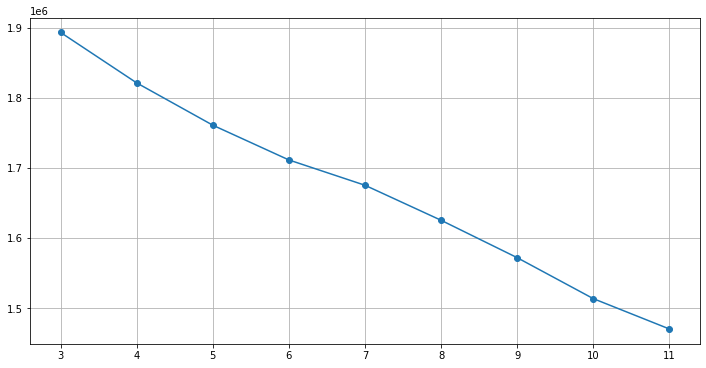

In [290]:
# lets do elbow analysis in plot graph


# allow plots to appear in the notebook

clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )

clusters_df[0:15]

%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))
plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )

In [291]:
# The error slope reduces after Km 8/ Km9 
# We can consider Km 8 to be ideal cluster segmentation .( there is no final / perfect accurate cluster segmenation in K means as its overall analysis of all different ,metrics above)

In [292]:
final_merge.drop(columns=['cluster_3', 'cluster_4', 'cluster_5', 'cluster_6',
       'cluster_7'] , inplace=True)

In [293]:
final_merge.head(5) 

,CustomerID,Tenure_Months,Transaction_ID,Quantity,Avg_Price,Delivery_Charges,GST,Discount_pct,invoice_amount,Offline_Spend,...,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,cluster_8
0,17850,12,17057.0,1,153.71,6.5,0.1,10,1515.229,4500,...,0,1,0,0,0,0,0,0,0,2
1,17850,12,17057.0,1,153.71,6.5,0.1,10,1515.229,4500,...,0,1,0,0,0,0,0,0,0,2
2,17850,12,17057.0,2,122.77,6.5,0.1,10,2424.346,4500,...,0,1,0,0,0,0,0,0,0,2
3,17850,12,17057.0,1,81.50,6.5,0.1,10,800.350,4500,...,0,1,0,0,0,0,0,0,0,2
4,17850,12,17057.0,1,153.71,6.5,0.1,10,1515.229,4500,...,0,1,0,0,0,0,0,0,0,2


# TO CONCLUDE , WE DIVIDED ABOVE DATA INTO CLUSTER 8 SEGMENTATION USING K MEANS SCIENTIFIC MODEL

In [294]:
#############################################################################################################################

# 4) PREDICTING CUSTOMER LIFETIME VALUE (LOW VALUE/ MEDIUM VALUE/ HIGH VALUE) 
## 1) DEFINE DEPENDENT VARIABLE WITH CATEGORIES AS LOW/MEDIUM/HIGH VALUE BASED ON REVENUE 
## 2) PERFORM CLASSIFICATION MODEL 

In [295]:
data_LTV= pd.merge( cust ,merge_marketing , "inner" , on="CustomerID")

In [296]:
data_LTV.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52524 entries, 0 to 52523
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   CustomerID           52524 non-null  int64         
 1   Gender               52524 non-null  object        
 2   Location             52524 non-null  object        
 3   Tenure_Months        52524 non-null  int64         
 4   Transaction_ID       52524 non-null  int64         
 5   Transaction_Date     52524 non-null  datetime64[ns]
 6   Product_SKU          52524 non-null  object        
 7   Product_Description  52524 non-null  object        
 8   Product_Category     52524 non-null  object        
 9   Quantity             52524 non-null  int64         
 10  Avg_Price            52524 non-null  float64       
 11  Delivery_Charges     52524 non-null  float64       
 12  Coupon_Status        52524 non-null  object        
 13  GST                  52524 non-

In [297]:
data_LTV.invoice_amount.quantile([0.33,0.66])

0.33     298.6878
0.66    1469.1000
Name: invoice_amount, dtype: float64

In [298]:
# creating y Or target variable based on invocie amount or revenue generated by each customers 
# we will create deciles and then based on deciles create derived Y variable = Lifetime_value 

In [299]:
data_LTV['Deciles'] = pd.qcut(data_LTV.invoice_amount, 3, labels=False)

In [300]:
data_LTV.Deciles.unique()

array([1, 2, 0], dtype=int64)

In [301]:
pd.Series(np.where(data_LTV.Deciles==2 , "high" , np.where(data_LTV.Deciles==1 , "medium" , "low")))

0        medium
1        medium
2          high
3        medium
4        medium
          ...  
52519      high
52520      high
52521      high
52522      high
52523      high
Length: 52524, dtype: object

In [302]:
data_LTV["Lifetime_value"] =pd.Series(np.where(data_LTV.Deciles==2 , "high" , np.where(data_LTV.Deciles==1 , "medium" , "low")))

In [303]:
data_LTV.columns # 

Index(['CustomerID', 'Gender', 'Location', 'Tenure_Months', 'Transaction_ID',
       'Transaction_Date', 'Product_SKU', 'Product_Description',
       'Product_Category', 'Quantity', 'Avg_Price', 'Delivery_Charges',
       'Coupon_Status', 'GST', 'Month', 'Coupon_Code', 'Discount_pct',
       'invoice_amount', 'Offline_Spend', 'Online_Spend', 'total_marketing',
       'tax', 'Deciles', 'Lifetime_value'],
      dtype='object')

In [304]:
data_LTV.apply(lambda x:x.nunique())

CustomerID              1468
Gender                     2
Location                   5
Tenure_Months             49
Transaction_ID         25000
Transaction_Date         365
Product_SKU             1135
Product_Description      395
Product_Category          16
Quantity                 151
Avg_Price                542
Delivery_Charges         267
Coupon_Status              3
GST                        4
Month                     12
Coupon_Code               45
Discount_pct               3
invoice_amount         10832
Offline_Spend             11
Online_Spend             365
total_marketing          365
tax                     5193
Deciles                    3
Lifetime_value             3
dtype: int64

In [305]:

# We can drop all below variables 
#Product_SKU             1135 (high cordinality)
# Product_Description      395 (high cordinality)
# Coupon_Code               45 (high cordinality)
# CustomerID                    (uniue and primary)
# Transaction_ID                  (uniue and primary)
# Transaction_Date                (date to be removed as Month is already derived from date)
# Deciles                         (deciles not required as it was used to create target variable - Lifetime_value )

In [306]:
data_LTV.drop(columns=["Product_SKU", "Product_Description", 'Coupon_Code' , "CustomerID", "Transaction_ID", "Transaction_Date", 'Deciles'], inplace=True)

In [307]:
data_LTV.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52524 entries, 0 to 52523
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Gender            52524 non-null  object 
 1   Location          52524 non-null  object 
 2   Tenure_Months     52524 non-null  int64  
 3   Product_Category  52524 non-null  object 
 4   Quantity          52524 non-null  int64  
 5   Avg_Price         52524 non-null  float64
 6   Delivery_Charges  52524 non-null  float64
 7   Coupon_Status     52524 non-null  object 
 8   GST               52524 non-null  float64
 9   Month             52524 non-null  object 
 10  Discount_pct      52524 non-null  int64  
 11  invoice_amount    52524 non-null  float64
 12  Offline_Spend     52524 non-null  int64  
 13  Online_Spend      52524 non-null  float64
 14  total_marketing   52524 non-null  float64
 15  tax               52524 non-null  float64
 16  Lifetime_value    52524 non-null  object

In [308]:
data_LTV_cat = data_LTV.select_dtypes("object")

In [309]:
data_LTV_numeric = data_LTV.select_dtypes(["int64" , "float64"])

In [310]:
# apply outliers  on numeric data 
#Handling Outliers 
def outlier_capping(x):
    #x = x.clip_upper(x.quantile(0.99))
    #x = x.clip_lower(x.quantile(0.01))
    x = x.clip(lower=x.quantile(0.01), upper=x.quantile(0.99))
    return x

data_LTV_numeric=data_LTV_numeric.apply(lambda x: outlier_capping(x))

In [311]:
#Handling missings on numeric data 
def Missing_imputation(x):
    x = x.fillna(x.mean())
    return x
data_LTV_numeric=data_LTV_numeric.apply(lambda x: Missing_imputation(x))

In [312]:
# handling missings on categorical data 
def Missing_imputation2(x):
    x = x.fillna(x.mode())
    return x
data_LTV_cat=data_LTV_cat.apply(lambda x: Missing_imputation2(x))

In [313]:
# creating dummies for categorcal 

data_LTV_cat = pd.get_dummies(data_LTV_cat , columns=[ 'Gender' , 'Location', 'Product_Category'  , 'Coupon_Status' , 'Month'], drop_first=True )

In [314]:
y = data_LTV_cat.Lifetime_value

In [315]:
data_LTV_cat.drop(columns='Lifetime_value'  , inplace=True)

In [316]:
x= pd.concat([data_LTV_cat , data_LTV_numeric], axis=1)

In [317]:
x

,Gender_M,Location_Chicago,Location_New Jersey,Location_New York,Location_Washington DC,Product_Category_Android,Product_Category_Apparel,Product_Category_Bags,Product_Category_Bottles,Product_Category_Drinkware,...,Quantity,Avg_Price,Delivery_Charges,GST,Discount_pct,invoice_amount,Offline_Spend,Online_Spend,total_marketing,tax
0,1,1,0,0,0,0,0,0,0,0,...,1,153.71,6.50,0.10,10,1515.2290,4500,2424.50,6924.50,138.3390
1,1,1,0,0,0,0,0,0,0,0,...,1,153.71,6.50,0.10,10,1515.2290,4500,2424.50,6924.50,138.3390
2,1,1,0,0,0,0,0,0,0,0,...,2,122.77,6.50,0.10,10,2424.3460,4500,2424.50,6924.50,220.9860
3,1,1,0,0,0,0,0,0,0,0,...,1,81.50,6.50,0.10,10,800.3500,4500,2424.50,6924.50,73.3500
4,1,1,0,0,0,0,0,0,0,0,...,1,153.71,6.50,0.10,10,1515.2290,4500,2424.50,6924.50,138.3390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52519,0,0,0,1,0,0,0,0,0,0,...,1,100.91,6.50,0.05,30,3066.2095,4000,2058.75,6058.75,146.3195
52520,0,0,0,1,0,0,0,0,0,0,...,1,100.91,6.50,0.05,30,3066.2095,4000,2058.75,6058.75,146.3195
52521,0,0,0,1,0,0,0,0,0,0,...,3,100.91,6.50,0.05,30,9211.6285,4000,2058.75,6058.75,438.9585
52522,0,0,0,0,0,0,0,0,0,0,...,5,80.52,6.50,0.10,30,12594.5000,4000,2058.75,6058.75,1167.5400


In [318]:
#Modules related to split the data & gridsearch
from sklearn.model_selection import train_test_split

#Module related to calculation of metrics
from sklearn import metrics

#Module related to VIF 
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.formula.api as smf

from sklearn.feature_selection import RFE, SelectKBest, chi2, f_classif

In [319]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

In [320]:

classifier = RandomForestClassifier()
rfe = RFE(classifier, 15)
rfe = rfe.fit(x, y )

C:\Users\vedso\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass n_features_to_select=15 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [321]:
imp_vars_RFE = list(x.columns[rfe.support_])

In [322]:
imp_vars_RFE

['Product_Category_Apparel',
 'Product_Category_Nest',
 'Product_Category_Nest-USA',
 'Product_Category_Office',
 'Month_Jan',
 'Month_Jul',
 'Month_Nov',
 'Month_Oct',
 'Quantity',
 'Avg_Price',
 'Delivery_Charges',
 'GST',
 'Discount_pct',
 'invoice_amount',
 'tax']

In [323]:

SKB = SelectKBest(f_classif, k=15).fit(x, y )

In [324]:
SKB.get_support()
imp_vars_SKB = list(x.columns[SKB.get_support()])

In [325]:
imp_vars_SKB

['Product_Category_Apparel',
 'Product_Category_Lifestyle',
 'Product_Category_Nest',
 'Product_Category_Nest-USA',
 'Product_Category_Office',
 'Month_Dec',
 'Month_Jul',
 'Month_Mar',
 'Month_Nov',
 'Quantity',
 'Avg_Price',
 'GST',
 'Discount_pct',
 'invoice_amount',
 'tax']

In [326]:
Final_list = list(set(imp_vars_SKB +  imp_vars_RFE))

In [327]:
len(Final_list) # 19 selected features 

18

In [328]:
x_new= x[Final_list ]   # final X variables after feature reduction 

In [329]:
y  # multiclass y variable 

0        medium
1        medium
2          high
3        medium
4        medium
          ...  
52519      high
52520      high
52521      high
52522      high
52523      high
Name: Lifetime_value, Length: 52524, dtype: object

In [330]:

from sklearn.preprocessing import LabelEncoder

from imblearn.over_sampling import SMOTE

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV


In [331]:
#Encoder for y variable
enc =LabelEncoder()
y = enc.fit_transform(y)

In [332]:
y  # y variable lebel incoded 

array([2, 2, 0, ..., 0, 0, 0])

In [333]:
pd.Series(y).value_counts()

2    17902
1    17509
0    17113
dtype: int64

In [334]:
#balancing the data as its multiclass classification
sm = SMOTE()
resampled_X, resampled_y = sm.fit_resample(x, y)

In [335]:
x.shape, y.shape, resampled_X.shape , resampled_y.shape

((52524, 44), (52524,), (53706, 44), (53706,))

In [336]:
#step 3 split data into train and test

#splitting to train and test dataset
X_train, X_test, y_train, y_test = train_test_split(resampled_X, resampled_y, test_size = 0.2)

In [337]:
# step 4) applying ML model of classification on data 

#### Random Forest 

Important Tuning Parameters for Random Forest:
criterion - measure for quality of a split
max_depth - The maximum depth of the tree.
max_leaf_nodes - Number of features to consider when looking for the best split
min_samples_leaf - The minimum number of samples required to be a leaf node. This may have effect of smoothing the model.
min_sample_split - The minimum number of samples required to split an internal node.
n_estimators - The number of trees in the forest
max_features - Number of features to consider when looking for the best split


In [338]:
# tuning parametes
pargrid_ada = {'n_estimators': [50, 60, 70, 80, 90, 100],
                'max_features': [5,6,7,8,9,10,11,12]}
gscv_Rf = GridSearchCV(estimator=RandomForestClassifier(), 
                        param_grid=pargrid_ada, 
                        cv=5,
                        verbose=True, n_jobs=-1)

In [339]:
gscv_results = gscv_Rf.fit(X_train, y_train)
gscv_results.best_score_

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:   33.2s
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:   46.6s finished


0.9999534504829513

In [340]:
gscv_results.best_params_

{'max_features': 7, 'n_estimators': 60}

In [341]:
gscv_results.best_score_

0.9999534504829513

In [342]:
radm_clf = RandomForestClassifier(oob_score=True,n_estimators= 50 , max_features=5, n_jobs=-1)
radm_clf.fit( X_train, y_train)

RandomForestClassifier(max_features=5, n_estimators=50, n_jobs=-1,
                       oob_score=True)

In [343]:
radm_clf

RandomForestClassifier(max_features=5, n_estimators=50, n_jobs=-1,
                       oob_score=True)

In [344]:
train_pred = radm_clf.predict(X_train)
test_pred = radm_clf.predict(X_test)

In [345]:
print(metrics.classification_report(y_train, train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14322
           1       1.00      1.00      1.00     14265
           2       1.00      1.00      1.00     14377

    accuracy                           1.00     42964
   macro avg       1.00      1.00      1.00     42964
weighted avg       1.00      1.00      1.00     42964



In [346]:
print(metrics.classification_report(y_test, test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3580
           1       1.00      1.00      1.00      3637
           2       1.00      1.00      1.00      3525

    accuracy                           1.00     10742
   macro avg       1.00      1.00      1.00     10742
weighted avg       1.00      1.00      1.00     10742



#### the train and test accuracy is similar
# this classfication multiclass model using Randomforest is helpful to predict LTV value of customers (high/Medium/Low)

In [347]:
################################################################################################################################

# Cross selling analysis (which products are selling together) 
# perform exploratory analysis and MBA to understand which products can be bundled together 

In [348]:
# we consider below Merged dataset  (sales, customer demo, invocie amount Or revenue generated)

In [349]:
merg3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52524 entries, 0 to 52523
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   CustomerID           52524 non-null  int64         
 1   Gender               52524 non-null  object        
 2   Location             52524 non-null  object        
 3   Tenure_Months        52524 non-null  int64         
 4   Transaction_ID       52524 non-null  int64         
 5   Transaction_Date     52524 non-null  datetime64[ns]
 6   Product_SKU          52524 non-null  object        
 7   Product_Description  52524 non-null  object        
 8   Product_Category     52524 non-null  object        
 9   Quantity             52524 non-null  int64         
 10  Avg_Price            52524 non-null  float64       
 11  Delivery_Charges     52524 non-null  float64       
 12  Coupon_Status        52524 non-null  object        
 13  GST                  52524 non-

In [350]:
merg3.Location.unique()

array(['Chicago', 'California', 'New York', 'New Jersey', 'Washington DC'],
      dtype=object)

In [351]:
# lets handle one location at time and come up with recommended similar products to be sold to clients in that location 


In [352]:
merg3.Product_Description= merg3.Product_Description.str.strip() # Removing unwanted space in Desciption


In [353]:
## Location 1) CHICAGO  ,

In [354]:
merg3.head(5)

,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status,GST,Month,Coupon_Code,Discount_pct,invoice_amount,week
0,17850,M,Chicago,12,16679,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229,00
1,17850,M,Chicago,12,16680,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229,00
2,17850,M,Chicago,12,16696,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,2,122.77,6.5,Not Used,0.1,Jan,ELEC10,10,2424.346,00
3,17850,M,Chicago,12,16699,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,1,81.50,6.5,Clicked,0.1,Jan,ELEC10,10,800.350,00
4,17850,M,Chicago,12,16700,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Clicked,0.1,Jan,ELEC10,10,1515.229,00


In [355]:
chicagodata = merg3[merg3.Location== 'Chicago'].groupby( [  "CustomerID","Transaction_ID" ,"Location" , "Product_Description"]).invoice_amount.sum()

In [356]:
chicagodata= chicagodata.unstack().reset_index().fillna(0).set_index("Transaction_ID")

In [357]:
#we need to consolidate the items into 1 transaction per row with each product 1 hot encoded.
# Convert the units to 1 hot encoded values
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1  

In [358]:
chicagodata.drop(columns= ['CustomerID' , 'Location'], inplace=True)

In [359]:
chicagodata = chicagodata.applymap(encode_units)

In [360]:
!pip install mlxtend

In [361]:
chicagodata[chicagodata.isna()==True] =0 

In [362]:
import pandas as pd
from mlxtend.frequent_patterns import apriori  # for removing least frequent combinations
from mlxtend.frequent_patterns import association_rules # for defining rule of combination

In [363]:
# Step to Build up the frequent items
#Now that the data is structured properly, we can generate frequent item sets that have a support of 
#at least 7% :
frequent_itemsets = apriori(chicagodata, min_support=0.03, use_colnames=True)

In [364]:
frequent_itemsets

,support,itemsets
0,0.030025,(Google Laptop and Cell Phone Stickers)
1,0.116427,(Nest Cam Indoor Security Camera - USA)
2,0.121395,(Nest Cam Outdoor Security Camera - USA)
3,0.133708,(Nest Learning Thermostat 3rd Gen-USA - Stainl...
4,0.043093,(Nest Learning Thermostat 3rd Gen-USA - White)
5,0.051841,(Nest Protect Smoke + CO White Battery Alarm-USA)
6,0.041365,(Nest Protect Smoke + CO White Wired Alarm-USA)
7,0.030457,(Nest Thermostat E - USA)


In [365]:
frequent_itemsets_chicago= frequent_itemsets.sort_values(by="support" , ascending=False)

In [366]:
frequent_itemsets_chicago

,support,itemsets
3,0.133708,(Nest Learning Thermostat 3rd Gen-USA - Stainl...
2,0.121395,(Nest Cam Outdoor Security Camera - USA)
1,0.116427,(Nest Cam Indoor Security Camera - USA)
5,0.051841,(Nest Protect Smoke + CO White Battery Alarm-USA)
4,0.043093,(Nest Learning Thermostat 3rd Gen-USA - White)
6,0.041365,(Nest Protect Smoke + CO White Wired Alarm-USA)
7,0.030457,(Nest Thermostat E - USA)
0,0.030025,(Google Laptop and Cell Phone Stickers)


#### In chicago , we can sell above products combination as bundleed together 

In [367]:
California_data = merg3[merg3.Location== "California"].groupby( [  "CustomerID","Transaction_ID" ,"Location" , "Product_Description"]).invoice_amount.sum()

In [368]:
California_data

CustomerID  Transaction_ID  Location    Product_Description                  
12348       31048           California  26 oz Double Wall Insulated Bottle       8545.5780
                                        Google Stylus Pen w/ LED Light           5257.5000
            31049           California  Google Kick Ball                           62.0978
                                        Google Laptop and Cell Phone Stickers      89.3810
                                        Google Sunglasses                         934.1600
                                                                                   ...    
18256       31893           California  Google Infant Short Sleeve Tee White      138.3258
                                        Google Onesie Green                       197.7978
18259       24877           California  Google Hard Cover Journal                3370.4750
            24878           California  Red Shine 15 oz Mug                       103.8418
            

In [369]:
California_data= California_data.unstack().reset_index().fillna(0).set_index("Transaction_ID")


In [370]:
California_data

Product_Description,CustomerID,Location,1 oz Hand Sanitizer,20 oz Stainless Steel Insulated Tumbler,22 oz Android Bottle,22 oz YouTube Bottle Infuser,23 oz Wide Mouth Sport Bottle,24 oz YouTube Sergeant Stripe Bottle,26 oz Double Wall Insulated Bottle,7&quot; Dog Frisbee,...,YouTube Trucker Hat,YouTube Twill Cap,YouTube Women's Favorite Tee White,YouTube Women's Fleece Hoodie Black,YouTube Women's Racer Back Tank Black,YouTube Women's Short Sleeve Hero Tee Charcoal,YouTube Women's Short Sleeve Tri-blend Badge Tee Charcoal,YouTube Womens 3/4 Sleeve Baseball Raglan White/Black,YouTube Wool Heather Cap Heather/Black,YouTube Youth Short Sleeve Tee Red
Transaction_ID,,,,,,,,,,,,,,,,,,,,,
31048,12348,California,0.0,0.0,0.0,0.0,0.0,0.0,8545.578,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31049,12348,California,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31050,12348,California,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31051,12348,California,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
41106,12348,California,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31892,18256,California,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
31893,18256,California,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
24877,18259,California,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [371]:
California_data.drop(columns= ['CustomerID' , 'Location'], inplace=True)

In [372]:
California_data = California_data.applymap(encode_units)

In [373]:
California_data

Product_Description,1 oz Hand Sanitizer,20 oz Stainless Steel Insulated Tumbler,22 oz Android Bottle,22 oz YouTube Bottle Infuser,23 oz Wide Mouth Sport Bottle,24 oz YouTube Sergeant Stripe Bottle,26 oz Double Wall Insulated Bottle,7&quot; Dog Frisbee,8 pc Android Sticker Sheet,Android 17oz Stainless Steel Sport Bottle,...,YouTube Trucker Hat,YouTube Twill Cap,YouTube Women's Favorite Tee White,YouTube Women's Fleece Hoodie Black,YouTube Women's Racer Back Tank Black,YouTube Women's Short Sleeve Hero Tee Charcoal,YouTube Women's Short Sleeve Tri-blend Badge Tee Charcoal,YouTube Womens 3/4 Sleeve Baseball Raglan White/Black,YouTube Wool Heather Cap Heather/Black,YouTube Youth Short Sleeve Tee Red
Transaction_ID,,,,,,,,,,,,,,,,,,,,,
31048,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31049,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31050,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31051,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41106,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31892,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31893,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24877,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [374]:
California_data[California_data.isna()==True] =0 

In [375]:
frequent_itemsets_California = apriori(California_data, min_support=0.03, use_colnames=True)

In [376]:
frequent_itemsets_California= frequent_itemsets_California.sort_values(by="support")

In [377]:
frequent_itemsets_California

,support,itemsets
0,0.030484,(Google Laptop and Cell Phone Stickers)
7,0.036332,(Nest Thermostat E - USA)
6,0.037825,(Nest Protect Smoke + CO White Wired Alarm-USA)
4,0.039940,(Nest Learning Thermostat 3rd Gen-USA - White)
5,0.050516,(Nest Protect Smoke + CO White Battery Alarm-USA)
1,0.118701,(Nest Cam Indoor Security Camera - USA)
2,0.125047,(Nest Cam Outdoor Security Camera - USA)
3,0.132388,(Nest Learning Thermostat 3rd Gen-USA - Stainl...


#### for California Location, we can bundle above items or products 

In [378]:
Newyork_data = merg3[merg3.Location== 'New York'].groupby( [  "CustomerID","Transaction_ID" ,"Location" , "Product_Description"]).invoice_amount.sum()

In [379]:
Newyork_data

CustomerID  Transaction_ID  Location  Product_Description                                   
12346       38223           New York  Android Men's Engineer Short Sleeve Tee Charcoal           609.0578
                                      Google Stylus Pen w/ LED Light                             275.9000
12347       23979           New York  Four Color Retractable Pen                                  80.9710
                                      Red Spiral Google Notebook                                 304.2710
            23980           New York  Nest Learning Thermostat 3rd Gen-USA - Stainless Steel    4746.6000
                                                                                                  ...    
18260       35329           New York  Google Women's Short Sleeve Hero Tee Grey                  108.3420
            35330           New York  Android Men's Pep Rally Short Sleeve Tee Navy              217.9758
            39892           New York  26 oz Double Wall Ins

In [380]:
Newyork_data= Newyork_data.unstack().reset_index().fillna(0).set_index("Transaction_ID")


In [381]:
Newyork_data

Product_Description,CustomerID,Location,1 oz Hand Sanitizer,20 oz Stainless Steel Insulated Tumbler,22 oz Android Bottle,22 oz YouTube Bottle Infuser,23 oz Wide Mouth Sport Bottle,24 oz YouTube Sergeant Stripe Bottle,26 oz Double Wall Insulated Bottle,7&quot; Dog Frisbee,...,YouTube Twill Cap,YouTube Women's Favorite Tee White,YouTube Women's Fleece Hoodie Black,YouTube Women's Racer Back Tank Black,YouTube Women's Short Sleeve Hero Tee Charcoal,YouTube Women's Short Sleeve Tri-blend Badge Tee Charcoal,YouTube Women's Short Sleeve Tri-blend Badge Tee Grey,YouTube Womens 3/4 Sleeve Baseball Raglan White/Black,YouTube Wool Heather Cap Heather/Black,YouTube Youth Short Sleeve Tee Red
Transaction_ID,,,,,,,,,,,,,,,,,,,,,
38223,12346,New York,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23979,12347,New York,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23980,12347,New York,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23981,12347,New York,0.0,0.0,0.0,0.0,0.0,770.5234,0.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
23984,12347,New York,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35327,18260,New York,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35328,18260,New York,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35329,18260,New York,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [382]:
Newyork_data.drop(columns= ['CustomerID' , 'Location'], inplace=True)
Newyork_data = Newyork_data.applymap(encode_units)
Newyork_data[Newyork_data.isna()==True] =0
frequent_itemsets_NewYork = apriori(Newyork_data, min_support=0.03, use_colnames=True)
frequent_itemsets_NewYork= frequent_itemsets_NewYork.sort_values(by="support")

In [383]:
frequent_itemsets_NewYork

,support,itemsets
0,0.031581,(Google Laptop and Cell Phone Stickers)
4,0.038041,(Nest Learning Thermostat 3rd Gen-USA - White)
6,0.040553,(Nest Protect Smoke + CO White Wired Alarm-USA)
5,0.050422,(Nest Protect Smoke + CO White Battery Alarm-USA)
1,0.125785,(Nest Cam Indoor Security Camera - USA)
2,0.132065,(Nest Cam Outdoor Security Camera - USA)
3,0.132245,(Nest Learning Thermostat 3rd Gen-USA - Stainl...


#### for New york  Location, we can bundle above items or products 

In [384]:


 Newjersey_data =merg3[merg3.Location== 'New Jersey'].groupby( [  "CustomerID","Transaction_ID" ,"Location" , "Product_Description"]).invoice_amount.sum().unstack().reset_index().fillna(0).set_index("Transaction_ID")

In [385]:
Newjersey_data

Product_Description,CustomerID,Location,1 oz Hand Sanitizer,20 oz Stainless Steel Insulated Tumbler,22 oz Android Bottle,22 oz YouTube Bottle Infuser,23 oz Wide Mouth Sport Bottle,24 oz YouTube Sergeant Stripe Bottle,26 oz Double Wall Insulated Bottle,7&quot; Dog Frisbee,...,YouTube Spiral Journal with Pen,YouTube Tee Black,YouTube Trucker Hat,YouTube Twill Cap,YouTube Women's Fleece Hoodie Black,YouTube Women's Short Sleeve Hero Tee Charcoal,YouTube Women's Short Sleeve Tri-blend Badge Tee Charcoal,YouTube Women's Short Sleeve Tri-blend Badge Tee Grey,YouTube Womens 3/4 Sleeve Baseball Raglan White/Black,YouTube Youth Short Sleeve Tee Red
Transaction_ID,,,,,,,,,,,,,,,,,,,,,
20027,12395,New Jersey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20028,12395,New Jersey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20030,12395,New Jersey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20031,12395,New Jersey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20032,12395,New Jersey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40286,18283,New Jersey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
40288,18283,New Jersey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
40289,18283,New Jersey,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [386]:
Newjersey_data.drop(columns= ['CustomerID' , 'Location'], inplace=True)
Newjersey_data= Newjersey_data.applymap(encode_units)
Newjersey_data[Newjersey_data.isna()==True] =0
frequent_itemsets_NewJersey= apriori(Newjersey_data, min_support=0.03, use_colnames=True)
frequent_itemsets_NewJersey= frequent_itemsets_NewJersey.sort_values(by="support")

 frequent_itemsets_NewJersey

In [387]:
frequent_itemsets_NewJersey

,support,itemsets
7,0.030250,(Nest Thermostat E - USA)
0,0.035072,(Google 22 oz Water Bottle)
6,0.041210,(Nest Protect Smoke + CO White Wired Alarm-USA)
4,0.045156,(Nest Learning Thermostat 3rd Gen-USA - White)
5,0.046909,(Nest Protect Smoke + CO White Battery Alarm-USA)
2,0.115739,(Nest Cam Outdoor Security Camera - USA)
3,0.127137,(Nest Learning Thermostat 3rd Gen-USA - Stainl...
1,0.132398,(Nest Cam Indoor Security Camera - USA)


## 
# For NEw Jersey Location , we can promote above bundled products togetehr 

In [388]:


Washington_DC_data =merg3[merg3.Location== 'Washington DC'].groupby( [  "CustomerID","Transaction_ID" ,"Location" , "Product_Description"]).invoice_amount.sum().unstack().reset_index().fillna(0).set_index("Transaction_ID")

In [389]:
Washington_DC_data.drop(columns= ['CustomerID' , 'Location'], inplace=True)
Washington_DC_data= Washington_DC_data.applymap(encode_units)
Washington_DC_data[Washington_DC_data.isna()==True] =0
frequent_itemsets_WashingtonDC= apriori(Washington_DC_data, min_support=0.03, use_colnames=True)
frequent_itemsets_WashingtonDC= frequent_itemsets_WashingtonDC.sort_values(by="support")

In [390]:
frequent_itemsets_WashingtonDC

,support,itemsets
6,0.031117,(Nest Thermostat E - USA)
3,0.038190,(Nest Learning Thermostat 3rd Gen-USA - White)
5,0.041018,(Nest Protect Smoke + CO White Wired Alarm-USA)
4,0.061528,(Nest Protect Smoke + CO White Battery Alarm-USA)
2,0.128713,(Nest Learning Thermostat 3rd Gen-USA - Stainl...
0,0.137907,(Nest Cam Indoor Security Camera - USA)
1,0.140736,(Nest Cam Outdoor Security Camera - USA)


#### for Washington DC , above products can be bundled together 

In [391]:
##########################################################################################################################

## Q. 6) Predicting next purchase date for customers(0-30 days, 30-60 days, 60-90 days, 90+ days )

In [392]:
for i in range(len(merg3.Transaction_Date)):
    
    if i >0:
        
        print (merg3.Transaction_Date[i] - merg3.Transaction_Date[i-1])

0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
2 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
1 days 00:00:00
0 days 00:00:00
0 days 00:00:00
12 days 00:00:00
0 days 00:00:00
1 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
1 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 00:00:00
0 days 

In [393]:





def find_avgdays(x) :
    
    
  
    
    
    for i in range(len(x)):
        
        
        if i >0:
            
            
            p= (x[i] - x[i-1])
            
            
            
            print (pd.Series(p))
            
   
            
            
            
            
            
            
           
            
             
            
        
    
    
        
        

In [394]:
lm= pd.to_datetime("2019-01-01" ) - (merg3.Transaction_Date)


In [395]:
purchasedays= abs(lm.astype(str).str.replace("days" , '').astype(int))

In [396]:
merg3['purchasedays']= purchasedays

In [397]:
merg3.drop(columns= 'purchasedays' , inplace=True)

In [398]:
num1= [purchasedays[i]- purchasedays[(i-1)] for i in range(len(purchasedays)) if i>0 ]



In [399]:
num1 = pd.Series(num1)


In [400]:
merg3["purchasedays"]= num1

In [401]:
cust_data = merg3.groupby(['CustomerID' , 'Gender' , "Location" , 'Product_SKU' , 'Product_Description' , 'Product_Category' , 'Coupon_Status', 'Coupon_Code'])[['Transaction_ID', 'purchasedays' , 'invoice_amount', "Quantity", 'Tenure_Months']].agg({'Transaction_ID': 'count', 'purchasedays': 'mean' , 'invoice_amount': sum , "Quantity" : sum , 'Tenure_Months' : 'mean' })

In [402]:
cust_data.columns = ('Transaction_ID_count', 'avg_purchasedays' , "invoice_amount" , "quantity" , 'Tenure_Months')

In [403]:
cust_data_repeat= cust_data[cust_data['Transaction_ID_count'] >1]

In [404]:
cust_data_repeat

Transaction_ID_count  \
CustomerID Gender Location   Product_SKU    Product_Description                                Product_Category Coupon_Status Coupon_Code                         
12347      M      New York   GGOEGBFC018799 Electronics Accessory Pouch                        Bags             Not Used      AIO30                           2   
                             GGOEGFKQ020799 Google Doodle Decal                                Office           Used          OFF20                           2   
                             GGOEGHPB071610 Google Twill Cap                                   Apparel          Clicked       SALE20                          2   
                             GGOENEBJ079499 Nest Learning Thermostat 3rd Gen-USA - Stainles... Nest-USA         Used          ELEC20                          3   
                             GGOENEBQ078999 Nest Cam Outdoor Security Camera - USA             Nest-USA         Used          ELEC30                          2   
...                                                                                                                                                         ...   
18283      F      New Jersey GGOENEBB078899 Nest Cam Indoor Security Camera - USA              Nest-USA         Clicked       ELEC10                          5   
                             GGOENEBQ078999 Nest Cam Outdoor Security Camera - USA             Nest-USA         Clicked       ELEC10                          2   
                                                                                                                Used          ELEC10                          3   
                             GGOEYAFB073115 YouTube Men's Fleece Hoodie Black                  Apparel          Clicked       SALE10                          2   
                             GGOEYFKQ020699 YouTube Custom Decals                              Office           Clicked       OFF10                           2   

                                                                                                                                           avg_purchasedays  \
CustomerID Gender Location   Product_SKU    Product_Description                                Product_Category Coupon_Status Coupon_Code                     
12347      M      New York   GGOEGBFC018799 Electronics Accessory Pouch                        Bags             Not Used      AIO30                     0.0   
                             GGOEGFKQ020799 Google Doodle Decal                                Office           Used          OFF20                     0.5   
                             GGOEGHPB071610 Google Twill Cap                                   Apparel          Clicked       SALE20                    0.5   
                             GGOENEBJ079499 Nest Learning Thermostat 3rd Gen-USA - Stainles... Nest-USA         Used          ELEC20                    0.0   
                             GGOENEBQ078999 Nest Cam Outdoor Security Camera - USA             Nest-USA         Used          ELEC30                    0.0   
...                                                                                                                                                     ...   
18283      F      New Jersey GGOENEBB078899 Nest Cam Indoor Security Camera - USA              Nest-USA         Clicked       ELEC10                  -14.6   
                             GGOENEBQ078999 Nest Cam Outdoor Security Camera - USA             Nest-USA         Clicked       ELEC10                    0.0   
                                                                                                                Used          ELEC10                    0.0   
                             GGOEYAFB073115 YouTube Men's Fleece Hoodie Black                  Apparel          Clicked       SALE10                    0.0   
                             GGOEYFKQ020699 YouTube Custom Decals                              Office          

In [405]:
pd.Series(np.where(cust_data_repeat.avg_purchasedays <=30 , "0-30days" ,  np.where(((cust_data_repeat.avg_purchasedays >30)& (cust_data_repeat.avg_purchasedays <=60)) , "30-60days" , np.where(((cust_data_repeat.avg_purchasedays >60)& (cust_data_repeat.avg_purchasedays <=90)),"60-90days" , "90days+" ))))

0       0-30days
1       0-30days
2       0-30days
3       0-30days
4       0-30days
          ...   
4766    0-30days
4767    0-30days
4768    0-30days
4769    0-30days
4770    0-30days
Length: 4771, dtype: object

In [406]:
avg_days= pd.Series(np.where(cust_data_repeat.avg_purchasedays <=30 , "0-30days" ,  np.where(((cust_data_repeat.avg_purchasedays >30)& (cust_data_repeat.avg_purchasedays <=60)) , "30-60days" , np.where(((cust_data_repeat.avg_purchasedays >60)& (cust_data_repeat.avg_purchasedays <=90)),"60-90days" , "90days+" ))))

In [407]:
cust_data_repeat.reset_index(level = ['CustomerID' , 'Gender', 'Location' , 'Product_SKU' , 'Product_Description' , 'Product_Category',  'Coupon_Status',  'Coupon_Status',  'Coupon_Code'] , inplace=True)

In [408]:
cust_data_repeat['avg_days'] = avg_days

<ipython-input-408-78d0ed1bf504>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cust_data_repeat['avg_days'] = avg_days


In [409]:
cust_data_repeat 

,CustomerID,Gender,Location,Product_SKU,Product_Description,Product_Category,Coupon_Status,Coupon_Code,Transaction_ID_count,avg_purchasedays,invoice_amount,quantity,Tenure_Months,avg_days
0,12347,M,New York,GGOEGBFC018799,Electronics Accessory Pouch,Bags,Not Used,AIO30,2,0.0,899.8768,6,20,0-30days
1,12347,M,New York,GGOEGFKQ020799,Google Doodle Decal,Office,Used,OFF20,2,0.5,85.5920,2,20,0-30days
2,12347,M,New York,GGOEGHPB071610,Google Twill Cap,Apparel,Clicked,SALE20,2,0.5,367.2936,2,20,0-30days
3,12347,M,New York,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,Used,ELEC20,3,0.0,12417.4200,4,20,0-30days
4,12347,M,New York,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,Used,ELEC30,2,0.0,11375.3000,3,20,0-30days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4766,18283,F,New Jersey,GGOENEBB078899,Nest Cam Indoor Security Camera - USA,Nest-USA,Clicked,ELEC10,5,-14.6,8994.7100,7,36,0-30days
4767,18283,F,New Jersey,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,Clicked,ELEC10,2,0.0,3122.2100,2,36,0-30days
4768,18283,F,New Jersey,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,Used,ELEC10,3,0.0,5865.5100,5,36,0-30days
4769,18283,F,New Jersey,GGOEYAFB073115,YouTube Men's Fleece Hoodie Black,Apparel,Clicked,SALE10,2,0.0,737.1348,2,36,0-30days


#### this is data based on customers with repeat transcations and with new dependent variable added as Avg_days of purchase made

# building classification model (multilclass) since y variable is multinomial 

In [410]:
#importing


from matplotlib import pyplot
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

In [411]:
pandas_profiling.ProfileReport(cust_data_repeat)

C:\Users\vedso\anaconda3\lib\site-packages\pandas\core\frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


In [412]:
cust_data_repeat.drop(columns=['Product_SKU' ,'Product_Description','Coupon_Code', 'CustomerID' , "avg_purchasedays" ] , inplace=True)

C:\Users\vedso\anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [413]:
cust_data_repeat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4771 entries, 0 to 4770
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Gender                4771 non-null   object 
 1   Location              4771 non-null   object 
 2   Product_Category      4771 non-null   object 
 3   Coupon_Status         4771 non-null   object 
 4   Transaction_ID_count  4771 non-null   int64  
 5   invoice_amount        4771 non-null   float64
 6   quantity              4771 non-null   int64  
 7   Tenure_Months         4771 non-null   int64  
 8   avg_days              4771 non-null   object 
dtypes: float64(1), int64(3), object(5)
memory usage: 335.6+ KB


In [414]:
cust_data_repeat=pd.get_dummies(cust_data_repeat, columns=['Gender' , 'Location' , 'Product_Category', 'Coupon_Status'] , drop_first=True)

In [415]:
cust_data_repeat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4771 entries, 0 to 4770
Data columns (total 26 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Transaction_ID_count                   4771 non-null   int64  
 1   invoice_amount                         4771 non-null   float64
 2   quantity                               4771 non-null   int64  
 3   Tenure_Months                          4771 non-null   int64  
 4   avg_days                               4771 non-null   object 
 5   Gender_M                               4771 non-null   uint8  
 6   Location_Chicago                       4771 non-null   uint8  
 7   Location_New Jersey                    4771 non-null   uint8  
 8   Location_New York                      4771 non-null   uint8  
 9   Location_Washington DC                 4771 non-null   uint8  
 10  Product_Category_Apparel               4771 non-null   uint8  
 11  Prod

In [416]:
cust_data_repeat.isna().sum() # no missing values 

Transaction_ID_count                     0
invoice_amount                           0
quantity                                 0
Tenure_Months                            0
avg_days                                 0
Gender_M                                 0
Location_Chicago                         0
Location_New Jersey                      0
Location_New York                        0
Location_Washington DC                   0
Product_Category_Apparel                 0
Product_Category_Bags                    0
Product_Category_Bottles                 0
Product_Category_Drinkware               0
Product_Category_Gift Cards              0
Product_Category_Headgear                0
Product_Category_Housewares              0
Product_Category_Lifestyle               0
Product_Category_Nest                    0
Product_Category_Nest-Canada             0
Product_Category_Nest-USA                0
Product_Category_Notebooks & Journals    0
Product_Category_Office                  0
Product_Cat

In [417]:
# lets split data into x and y variable 

#splitting 
X_variables  = cust_data_repeat.drop(columns = ['avg_days'])
y_variable = cust_data_repeat['avg_days']

In [418]:
X_variables.columns

Index(['Transaction_ID_count', 'invoice_amount', 'quantity', 'Tenure_Months',
       'Gender_M', 'Location_Chicago', 'Location_New Jersey',
       'Location_New York', 'Location_Washington DC',
       'Product_Category_Apparel', 'Product_Category_Bags',
       'Product_Category_Bottles', 'Product_Category_Drinkware',
       'Product_Category_Gift Cards', 'Product_Category_Headgear',
       'Product_Category_Housewares', 'Product_Category_Lifestyle',
       'Product_Category_Nest', 'Product_Category_Nest-Canada',
       'Product_Category_Nest-USA', 'Product_Category_Notebooks & Journals',
       'Product_Category_Office', 'Product_Category_Waze',
       'Coupon_Status_Not Used', 'Coupon_Status_Used'],
      dtype='object')

In [419]:
y_variable

0       0-30days
1       0-30days
2       0-30days
3       0-30days
4       0-30days
          ...   
4766    0-30days
4767    0-30days
4768    0-30days
4769    0-30days
4770    0-30days
Name: avg_days, Length: 4771, dtype: object

In [420]:
#Encoder for y variable
enc =LabelEncoder()
y_variable = enc.fit_transform(y_variable)

In [421]:
y_variable

array([0, 0, 0, ..., 0, 0, 0])

In [422]:
pd.Series(y_variable).value_counts()

0    4526
1     159
2      51
3      35
dtype: int64

In [423]:
sm = SMOTE()
resampled_X_variables, resampled_y_variable = sm.fit_resample(X_variables, y_variable)

In [424]:
X_variables.shape , y_variable.shape

((4771, 25), (4771,))

In [425]:
resampled_X_variables.shape, resampled_y_variable.shape

((18104, 25), (18104,))

In [426]:
#splitting to train and test dataset
trainx, testx, trainy, testy = train_test_split(resampled_X_variables, resampled_y_variable, test_size = 0.30)

In [427]:
#svc = SVC(kernel='rbf', class_weight='balanced')
from sklearn.svm import SVC

param_grid = {'C': [1]}
gridnew = GridSearchCV(SVC(), param_grid)

gridnew.fit(trainx, trainy)
print(gridnew.best_params_)

{'C': 1}


In [428]:
modelnew = gridnew.best_estimator_


In [429]:
yfittest = modelnew.predict(testx)

In [430]:
yfittrain = modelnew.predict(trainx)

In [431]:
from sklearn.metrics import classification_report
print(classification_report(testy , yfittest))

              precision    recall  f1-score   support

           0       0.32      0.21      0.25      1369
           1       0.33      0.33      0.33      1370
           2       0.23      0.11      0.14      1328
           3       0.33      0.62      0.43      1365

    accuracy                           0.32      5432
   macro avg       0.30      0.32      0.29      5432
weighted avg       0.30      0.32      0.29      5432



In [432]:
print(classification_report(trainy , yfittrain))

              precision    recall  f1-score   support

           0       0.31      0.22      0.26      3157
           1       0.31      0.32      0.31      3156
           2       0.24      0.11      0.15      3198
           3       0.33      0.59      0.42      3161

    accuracy                           0.31     12672
   macro avg       0.30      0.31      0.29     12672
weighted avg       0.30      0.31      0.29     12672



In [433]:
# classification report for train and test for SVM model is similaer 

In [434]:
xgb = XGBClassifier(n_estimators=100,
                    max_depth=15, 
                    gamma = 7)
eval_set = [(trainx, trainy), (testx, testy)]
eval_metric = ["mlogloss"]
xgb.fit(trainx, trainy, eval_metric=eval_metric, eval_set=eval_set, verbose=True)
xgb.score(trainx, trainy)
xgb.score(testx, testy)

C:\Users\vedso\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-mlogloss:1.01533	validation_1-mlogloss:1.03157
[1]	validation_0-mlogloss:0.81463	validation_1-mlogloss:0.83857
[2]	validation_0-mlogloss:0.68870	validation_1-mlogloss:0.71779
[3]	validation_0-mlogloss:0.60730	validation_1-mlogloss:0.63859
[4]	validation_0-mlogloss:0.54460	validation_1-mlogloss:0.57880
[5]	validation_0-mlogloss:0.50137	validation_1-mlogloss:0.53725
[6]	validation_0-mlogloss:0.46704	validation_1-mlogloss:0.50398
[7]	validation_0-mlogloss:0.43920	validation_1-mlogloss:0.47649
[8]	validation_0-mlogloss:0.41887	validation_1-mlogloss:0.45653
[9]	validation_0-mlogloss:0.40416	validation_1-mlogloss:0.44179
[10]	validation_0-mlogloss:0.39390	validation_1-mlogloss:0.43180
[11]	validation_0-mlogloss:0.38276	validation_1-mlogloss:0.42050
[12]	validation_0-mlogloss:0.37541	validation_1-mlogloss:0.41351
[13]	validation_0-mlogloss:0.36749	validation_1-mlogloss:0.40567
[14]	validation_0-mlogloss:0.35492	validation_1-mlogloss:0.39320
[15]	validation_0-mlogloss:0.34301	

0.9051914580265096

In [435]:
print(xgb.score(trainx, trainy) ,xgb.score(testx, testy))
# as per above XGB classfier test and train data have similar score 

0.9254261363636364 0.9051914580265096


## # classification model performed to predict avg_purchase next days for selected customer wth repeat transcations based on SVM nd XGB models 

In [436]:
###########################################################################################################################

#   7) COHORT ANALYSIS 

# cohort means group of customers with similar behaviour.like first purchase date 
# we will see monthly retention of clients and study when its max and when its minimum.

In [438]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from operator import attrgetter
import matplotlib.colors as mcolors

In [446]:
merg3.head(2)

,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,Quantity,Avg_Price,Delivery_Charges,Coupon_Status,GST,Month,Coupon_Code,Discount_pct,invoice_amount,week,purchasedays
0,17850,M,Chicago,12,16679,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229,00,0.0
1,17850,M,Chicago,12,16680,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,1,153.71,6.5,Used,0.1,Jan,ELEC10,10,1515.229,00,0.0


In [450]:
# Step 1) select only relative variables and drop duplicates if any 

cohort_data = merg3[['CustomerID', 'Transaction_ID', 'Transaction_Date']].drop_duplicates()

In [464]:
# We create cohort variable and order month variable 
# order month = month in which transcation ordered
merg3['order_month']  = merg3['Transaction_Date'].dt.to_period('M')


In [465]:
# cohort = first date of transcation per client
merg3['cohort']= merg3.groupby('CustomerID')['Transaction_Date'].transform("min").dt.to_period('M') 

In [474]:
# Step 3) we aggregate data based on order_month and cohort and count of numbers of customers in them

merg3_cohort = merg3.groupby(['cohort', 'order_month'])['CustomerID'].count().reset_index(drop=False)

In [500]:
# step 4) we find no of periods between cohort(start month) and purchase month.

merg3_cohort["period_number"] = (merg3_cohort.order_month - merg3_cohort.cohort).apply(attrgetter('n'))

In [501]:
merg3_cohort.columns= ['cohort' , 'order_month' , 'CustomerID_count' , "period_number"]

In [502]:
merg3_cohort  # in this we can see someone has started and purchased same month, whereas some otehr clients have purchased 1 month/2 month /3 months later than they started 


,cohort,order_month,CustomerID_count,period_number
0,2019-01,2019-01,4023,0
1,2019-01,2019-02,436,1
2,2019-01,2019-03,604,2
3,2019-01,2019-04,758,3
4,2019-01,2019-05,446,4
...,...,...,...,...
73,2019-10,2019-11,56,1
74,2019-10,2019-12,27,2
75,2019-11,2019-11,1785,0
76,2019-11,2019-12,33,1


In [503]:
# will create pivot table where each row will be a cohort and each column would show total clients for that period.
cohort_pivot = merg3_cohort.pivot_table(index = 'cohort',
                                     columns = 'period_number',
                                     values = 'CustomerID_count')

In [504]:
cohort_pivot

period_number,0,1,2,3,4,5,6,7,8,9,10,11
cohort,,,,,,,,,,,,
2019-01,4023.0,436.0,604.0,758.0,446.0,761.0,1010.0,744.0,523.0,469.0,316.0,749.0
2019-02,2809.0,142.0,157.0,353.0,316.0,688.0,384.0,523.0,174.0,216.0,393.0,NaN
2019-03,3544.0,366.0,500.0,331.0,587.0,801.0,555.0,341.0,241.0,333.0,NaN,NaN
2019-04,2817.0,233.0,221.0,424.0,316.0,285.0,142.0,370.0,166.0,NaN,NaN,NaN
2019-05,2984.0,90.0,186.0,279.0,164.0,428.0,257.0,113.0,NaN,NaN,NaN,NaN
2019-06,2440.0,223.0,214.0,211.0,148.0,332.0,158.0,NaN,NaN,NaN,NaN,NaN
2019-07,2078.0,235.0,89.0,175.0,137.0,226.0,NaN,NaN,NaN,NaN,NaN,NaN
2019-08,3139.0,90.0,119.0,221.0,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-09,1833.0,19.0,26.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [505]:

####  To obtain the retention matrix , we need to divide the values each row by the row's first value, which is actually the cohort size — all customers who made their first purchase in the given month.

cohort_size = cohort_pivot.iloc[:,0]
retention_matrix = cohort_pivot.divide(cohort_size, axis = 0)

In [507]:
retention_matrix

period_number,0,1,2,3,4,5,6,7,8,9,10,11
cohort,,,,,,,,,,,,
2019-01,1.0,0.108377,0.150137,0.188417,0.110863,0.189162,0.251056,0.184937,0.130002,0.116580,0.078548,0.186179
2019-02,1.0,0.050552,0.055892,0.125667,0.112496,0.244927,0.136703,0.186187,0.061944,0.076896,0.139907,NaN
2019-03,1.0,0.103273,0.141084,0.093397,0.165632,0.226016,0.156603,0.096219,0.068002,0.093962,NaN,NaN
2019-04,1.0,0.082712,0.078452,0.150515,0.112176,0.101171,0.050408,0.131345,0.058928,NaN,NaN,NaN
2019-05,1.0,0.030161,0.062332,0.093499,0.054960,0.143432,0.086126,0.037869,NaN,NaN,NaN,NaN
2019-06,1.0,0.091393,0.087705,0.086475,0.060656,0.136066,0.064754,NaN,NaN,NaN,NaN,NaN
2019-07,1.0,0.113090,0.042830,0.084216,0.065929,0.108758,NaN,NaN,NaN,NaN,NaN,NaN
2019-08,1.0,0.028672,0.037910,0.070405,0.037273,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-09,1.0,0.010366,0.014184,0.003273,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [509]:
# we reprsent this retenstion matrix with heatmap 

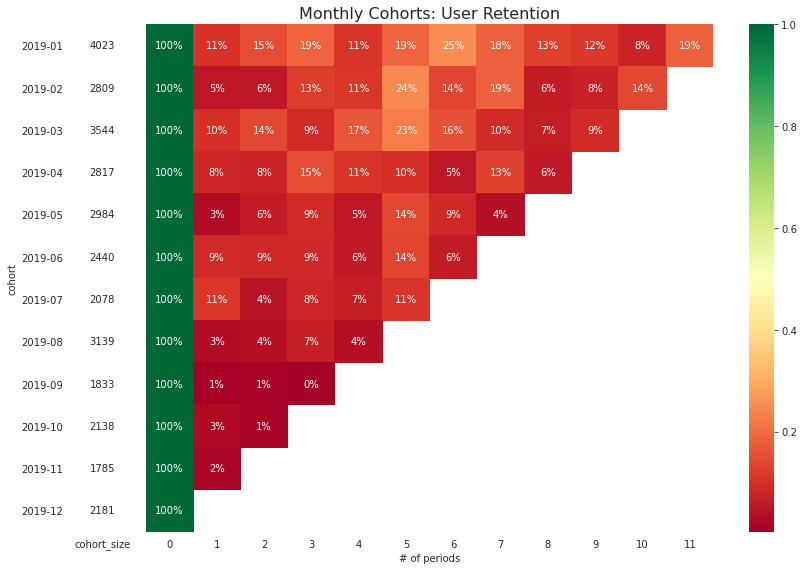

In [508]:
with sns.axes_style("white"):
    fig, ax = plt.subplots(1, 2, figsize=(12, 8), sharey=True, gridspec_kw={'width_ratios': [1, 11]})
    
    # retention matrix
    sns.heatmap(retention_matrix, 
                mask=retention_matrix.isnull(), 
                annot=True, 
                fmt='.0%', 
                cmap='RdYlGn', 
                ax=ax[1])
    ax[1].set_title('Monthly Cohorts: User Retention', fontsize=16)
    ax[1].set(xlabel='# of periods',
              ylabel='')

    # cohort size
    cohort_size_df = pd.DataFrame(cohort_size).rename(columns={0: 'cohort_size'})
    white_cmap = mcolors.ListedColormap(['white'])
    sns.heatmap(cohort_size_df, 
                annot=True, 
                cbar=False, 
                fmt='g', 
                cmap=white_cmap, 
                ax=ax[0])

    fig.tight_layout()

# As per first month in Jan 2019 , max clients started .
# clients who joined in first cohort (jan 2019), only 19% of them retained at the year end .
# for other cohorts (from feb till Dec), retention percentage is gone much down 


# Throughout the matrix, we can see fluctuations in retention over time. This might be caused by the characteristics of the business, where clients do periodic purchases, followed by periods of inactivity.

## Jan 2019 has maximum retention of customers 